In [1]:
# Importing stock ml libraries
import numpy as np
import pandas as pd
from sklearn import metrics, preprocessing
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from sklearn.metrics.pairwise import cosine_similarity

In [2]:
#np.savetxt("g0PooledEmbeddings.csv", g0PooledEmbeddings, delimiter=",")
#np.savetxt("g1PooledEmbeddings.csv", g1PooledEmbeddings, delimiter=",")
#np.savetxt("g2PooledEmbeddings.csv", g2PooledEmbeddings, delimiter=",")
#np.savetxt("g3PooledEmbeddings.csv", g3PooledEmbeddings, delimiter=",")
g0PooledEmbeddings = np.genfromtxt('g0PooledEmbeddings.csv', delimiter=',')
g1PooledEmbeddings = np.genfromtxt('g1PooledEmbeddings.csv', delimiter=',')
g2PooledEmbeddings = np.genfromtxt('g2PooledEmbeddings.csv', delimiter=',')
g3PooledEmbeddings = np.genfromtxt('g3PooledEmbeddings.csv', delimiter=',')

In [3]:
allprojected = np.genfromtxt('allprojected.csv', delimiter=',')
g0projected = allprojected[:8576]
print(len(g0projected))
g1projected = allprojected[8576:17152]
print(len(g1projected))
g2projected = allprojected[17152:25728]
print(len(g2projected))
g3projected = allprojected[25728:]
print(len(g3projected))

8576
8576
8576
8576


In [5]:
df = pd.read_csv('changedoriginalratings0MasterAffectEventReducedV3.csv')
g0df = df[['Affect', 'Original StoryID', 'Original text', 'Affect Rating',
           'G0 Affect Level', 'G1 Affect Level', 'G2 Affect Level', 'G3 Affect Level',
           'G0-G1 CS','G1-G2 CS', 'G2-G3 CS', 'G0-G2 CS', 'G0-G3 CS', 'G1-G3 CS']]
g1df = df[['G1 Story', 'G1 WC', 'G1 StoryID', 'G1 Affect Rating', 'G1 emotional effect', 'G1 Transport',
            'G1 Event Presence', 'G1 Gender', 'G1 Age', 'G1 Native Lang', 'G1 Edu', 'G1 Reading habits']]
g2df = df[['G2 Retelling', 'G2 WC', 'G2 StoryID', 'G2 Affect Rating', 'G2 Event Presence', 'G2 Gender', 
           'G2 Age','G2 Native Lang', 'G2 Edu', 'G2 Reading habits']]
g3df = df[['G3 Retelling', 'G3 WC', 'G3 StoryID', 'G3 Affect Rating', 'G3 emotional effect', 'G3 Transport',
           'G3 Event Presence', 'G3 Gender', 'G3 Age', 'G3 Native Lang', 'G3 Edu', 'G3 Reading habits']]
df.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'Number', 'Affect', 'G0 Affect Level',
       'G1 Affect Level', 'G2 Affect Level', 'G3 Affect Level',
       'Original StoryID', 'Original text', 'Affect Rating', 'G1 Story',
       'G1 WC', 'G1 StoryID', 'G1 StoryID QUALTRICS', 'G1 ID',
       'G1 Affect Rating', 'G1 emotional effect', 'G1 Transport',
       'G1 Event Presence', 'G1 Gender', 'G1 Age', 'G1 Native Lang', 'G1 Edu',
       'G1 Reading habits', 'G2 Retelling', 'G2 WC', 'G2 ID', 'G2 StoryID',
       'G2 Affect Rating', 'G2 Event Presence', 'G2 Gender', 'G2 Age',
       'G2 Native Lang', 'G2 Edu', 'G2 Reading habits', 'G3 StoryID',
       'G3 StoryID QUALTRICS', 'G3 Retelling', 'G3 WC', 'G3 ID',
       'G3 Affect Rating', 'G3 emotional effect', 'G3 Transport',
       'G3 Event Presence', 'G3 Gender', 'G3 Age', 'G3 Native Lang', 'G3 Edu',
       'G3 Reading habits', 'G0-G1 CS', 'G0-G2 CS', 'G0-G3 CS', 'G1-G2 CS',
       'G2-G3 CS', 'G1-G3 CS', 'G0-G1 27PC ED', 'G0-G2 27PC ED',
       'G0-

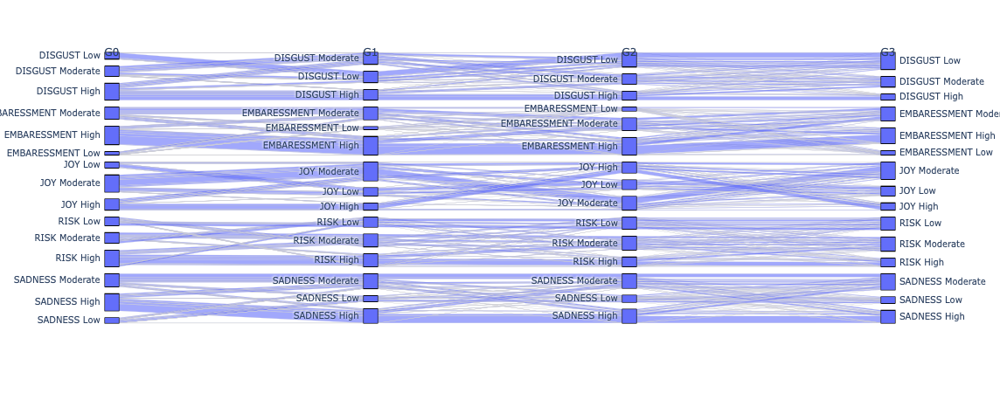

In [6]:
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
import plotly.express as px

fig = px.parallel_categories(df, dimensions=['G0 Affect Level', 'G1 Affect Level', 'G2 Affect Level', 'G3 Affect Level'],
                #color="G0 Affect Level", color_continuous_scale=px.colors.sequential.Inferno,
                labels={'G0 Affect Level':'G0', 'G1 Affect Level':'G1', 'G2 Affect Level':'G2', 'G3 Affect Level':'G3'})
fig.show()

In [7]:
from sklearn.decomposition import PCA, KernelPCA
#from sklearn.neighbors import NearestCentroid

#def features_to_components_and_centroids(features, centroid_labels, n_components, kernel):
def features_to_components(features, n_components, kernel):
    pca = KernelPCA(n_components=n_components,kernel=kernel)
    projected = pca.fit_transform(features)
    # Find centroids of clusters
    #clf = NearestCentroid()
    #clf.fit(projected, centroid_labels)
    #return projected, clf.centroids_
    return projected

In [8]:
allPooledEmbeddings = np.concatenate((g0PooledEmbeddings, g1PooledEmbeddings, g2PooledEmbeddings, g3PooledEmbeddings), axis=0)
pca99 = PCA(n_components = 0.99)
pca99.fit(allPooledEmbeddings)
print("Number of components that explains 99% of variance: ",pca99.n_components_)
allprojected = pca99.transform(allPooledEmbeddings)

Number of components that explains 99% of variance:  27


In [9]:
#with open("allembeddingspc.pkl",'wb') as file:
#    pickle.dump(allprojected, file)
#with open("allembeddingspc.pkl", 'rb') as file:
#    allprojected = pickle.load(file)
#np.savetxt("allPooledEmbeddings.csv", allPooledEmbeddings, delimiter=",")
#np.savetxt("allprojected.csv", allprojected, delimiter=",")
#allPooledEmbeddings = np.genfromtxt('allPooledEmbeddings.csv', delimiter=',')
allprojected = np.genfromtxt('allprojected.csv', delimiter=',')
g0projected = allprojected[:8576]
print(len(g0projected))
g1projected = allprojected[8576:17152]
print(len(g1projected))
g2projected = allprojected[17152:25728]
print(len(g2projected))
g3projected = allprojected[25728:]
print(len(g3projected))

8576
8576
8576
8576


In [10]:
all_affect_rating = np.concatenate((df['Affect Rating'].values,df['G1 Affect Rating'].values,
                                    df['G2 Affect Rating'].values,df['G3 Affect Rating'].values), axis=0)

In [11]:
from sklearn import preprocessing
#all_affect = np.concatenate((df['G0 Affect Level'].values,df['G1 Affect Level'].values,df['G2 Affect Level'].values,df['G3 Affect Level'].values),axis=0)
all_affect = np.concatenate((df['Affect'].values,df['Affect'].values,df['Affect'].values,df['Affect'].values),axis=0)
lab_enc = preprocessing.LabelEncoder()
Y = lab_enc.fit_transform(all_affect)
le_name_mapping = dict(zip(lab_enc.classes_, lab_enc.transform(lab_enc.classes_)))
print(le_name_mapping)

{'DISGUST': 0, 'EMBARESSMENT': 1, 'JOY': 2, 'RISK': 3, 'SADNESS': 4}


In [12]:
Y_c = []
for l in Y:
    if l == 0:
        Y_c.append(0)
    elif l == 1:
        Y_c.append(3)
    elif l == 2:
        Y_c.append(6)
    elif l == 3:
        Y_c.append(8)
    else:
        Y_c.append(11)
pca99.explained_variance_

array([23.17914239, 20.96566894, 18.1376312 , 16.11353538, 11.89866437,
       10.82641289, 10.33903153,  9.5225005 ,  7.63119828,  7.25477476,
        6.72603981,  5.4243514 ,  2.74176857,  0.99950282,  0.40977062,
        0.183166  ,  0.17645644,  0.14677768,  0.13726056,  0.09438624,
        0.08853423,  0.07387766,  0.06182839,  0.05149591,  0.04733886,
        0.0415298 ,  0.03592942])

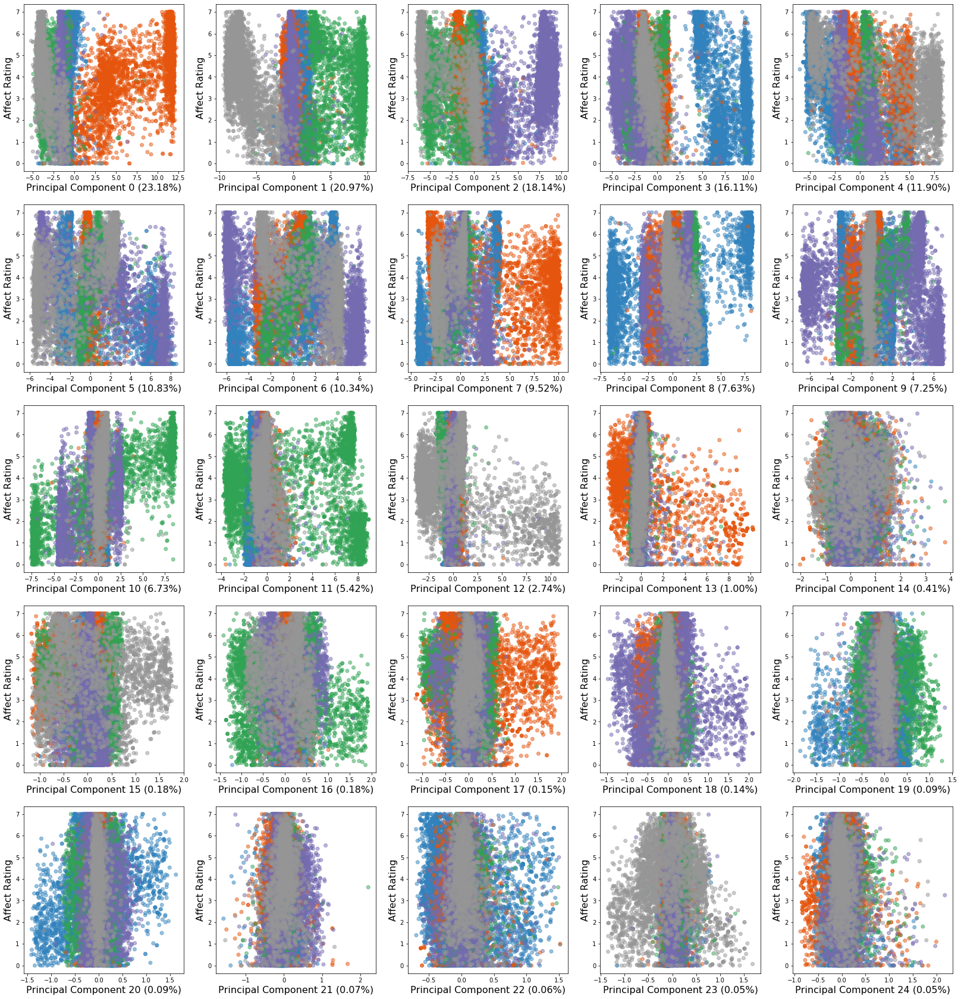

In [15]:
fig, axs = plt.subplots(5,5,figsize=(28,30))
axs = axs.ravel()
for i in range(25):
    axs[i].scatter(allprojected[:,i], all_affect_rating,
            alpha=0.5, c=Y_c,
            cmap=plt.cm.get_cmap('tab20c', 15),vmax=13)#len(le_name_mapping)))
    axs[i].set_xlabel(f'Principal Component {i} ({pca99.explained_variance_[i]:.2f}%)',fontsize=16)
    axs[i].set_ylabel('Affect Rating',fontsize=16)
plt.show()
#fig.savefig("27PC768RoBERTascatter.png")

In [4]:
from sklearn.metrics.pairwise import euclidean_distances, cosine_similarity, cosine_distances

In [5]:
# Within generation CS per story ID
def get_cs_df(g_embs, cs_name):
    cs, affects, storyids = [], [], []
    for storyid in set(df['Original StoryID'].values):
        id_mask = np.where(df['Original StoryID']==storyid)
        affect = df['Affect'].values[id_mask][0]
        cs_matrix = cosine_similarity(g_embs[id_mask], g_embs[id_mask])
        #cs_matrix = euclidean_distances(g_embs[id_mask], g_embs[id_mask])
        cs.extend(cs_matrix[np.triu_indices(len(cs_matrix), k = 1)].flatten())
        affects.extend([affect for i in range(len(cs_matrix[np.triu_indices(len(cs_matrix), k = 1)].flatten()))])
        storyids.extend([storyid for i in range(len(cs_matrix[np.triu_indices(len(cs_matrix), k = 1)].flatten()))])
    cs_df = pd.DataFrame(list(zip(affects, storyids, cs)), columns =['Affect', 'StoryID', cs_name])
    return cs_df
g0cs = get_cs_df(g0PooledEmbeddings, 'G0')
g1cs = get_cs_df(g1PooledEmbeddings, 'G1')
g2cs = get_cs_df(g2PooledEmbeddings, 'G2')
g3cs = get_cs_df(g3PooledEmbeddings, 'G3')

#g0cs = get_cs_df(g0projected, 'G0')
#g1cs = get_cs_df(g1projected, 'G1')
#g2cs = get_cs_df(g2projected, 'G2')
#g3cs = get_cs_df(g3projected, 'G3')

In [6]:
all_within_cs = pd.concat([g0cs, g1cs['G1'], g2cs['G2'], g3cs['G3']], axis=1)
all_within_cs["id"] = all_within_cs.index

In [7]:
all_within_cs

,Affect,StoryID,G0,G1,G2,G3,id
0,DISGUST,Arnold I,1.0,0.998638,0.993161,0.997343,0
1,DISGUST,Arnold I,1.0,0.998638,0.998768,0.997938,1
2,DISGUST,Arnold I,1.0,0.998638,0.997412,0.971038,2
3,DISGUST,Arnold I,1.0,0.996648,0.997298,0.990353,3
4,DISGUST,Arnold I,1.0,0.996648,0.998308,0.997273,4
...,...,...,...,...,...,...,...
377515,JOY,Tony H,1.0,0.997627,0.986957,0.681412,377515
377516,JOY,Tony H,1.0,0.997627,0.994980,0.993483,377516
377517,JOY,Tony H,1.0,0.997627,0.986957,0.717874,377517
377518,JOY,Tony H,1.0,0.997627,0.994980,0.987963,377518


In [8]:
print(all_within_cs[all_within_cs['Affect']=="DISGUST"]['G1'].mean())
print(all_within_cs[all_within_cs['Affect']=="EMBARESSMENT"]['G1'].mean())
print(all_within_cs[all_within_cs['Affect']=="JOY"]['G1'].mean())
print(all_within_cs[all_within_cs['Affect']=="SADNESS"]['G1'].mean())
print(all_within_cs[all_within_cs['Affect']=="RISK"]['G1'].mean())


0.8442511038897474
0.8983586766142537
0.862076844259846
0.8694600122019459
0.8191312617824107


In [9]:
#all_within_cs_l = pd.wide_to_long(all_within_cs, stubnames=['CD'], i='id', j='Generation',sep=' ')
#all_within_cs_l.rename(columns = {'CD':'Cosine Distance'}, inplace = True) 
all_within_cs_l = pd.melt(all_within_cs, id_vars=['id','Affect','StoryID'], value_vars=['G0', 'G1', 'G2', 'G3'])
all_within_cs_l.rename(columns = {'variable': 'Generation', 'value':'Cosine Similarity'}, inplace = True)
all_within_cs_l["Affect"] = all_within_cs_l["Affect"].replace(['DISGUST'],'Disgust')
all_within_cs_l["Affect"] = all_within_cs_l["Affect"].replace(['EMBARESSMENT'],'Embarrassment')
all_within_cs_l["Affect"] = all_within_cs_l["Affect"].replace(['JOY'],'Joy')
all_within_cs_l["Affect"] = all_within_cs_l["Affect"].replace(['SADNESS'],'Sadness')
all_within_cs_l["Affect"] = all_within_cs_l["Affect"].replace(['RISK'],'Risk')
all_within_cs_l

,id,Affect,StoryID,Generation,Cosine Similarity
0,0,Disgust,Arnold I,G0,1.000000
1,1,Disgust,Arnold I,G0,1.000000
2,2,Disgust,Arnold I,G0,1.000000
3,3,Disgust,Arnold I,G0,1.000000
4,4,Disgust,Arnold I,G0,1.000000
...,...,...,...,...,...
1510075,377515,Joy,Tony H,G3,0.681412
1510076,377516,Joy,Tony H,G3,0.993483
1510077,377517,Joy,Tony H,G3,0.717874
1510078,377518,Joy,Tony H,G3,0.987963


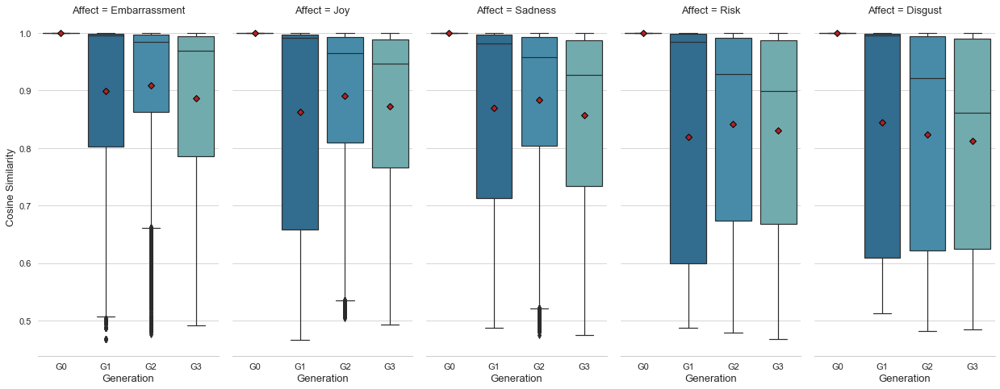

In [10]:
sns.set(style="whitegrid")
sns.set_context("paper", rc={"font.size":16,"axes.titlesize":13,"axes.labelsize":13,"xtick.labelsize":11,"ytick.labelsize":11})
meanpointprops = dict(marker='D', markeredgecolor='black',markerfacecolor='firebrick')
g = sns.catplot(x="Generation", y="Cosine Similarity", col="Affect", col_order=['Embarrassment','Joy','Sadness','Risk','Disgust'], palette="YlGnBu_d", height=7, aspect=.5,
                kind="box", meanline=False, showmeans=True, meanprops=meanpointprops, data=all_within_cs_l)
g.despine(left=True)
#g.savefig("768CSwithin.png")

In [5]:
affects, levels = df['G1 Affect Level'].str.split(' ', 1).str

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Columnar iteration over characters will be deprecated in future releases.
  """Entry point for launching an IPython kernel.


In [44]:
g0vsg1 = cosine_similarity(g0PooledEmbeddings, g1PooledEmbeddings).diagonal()
g0vsg2 = cosine_similarity(g0PooledEmbeddings, g2PooledEmbeddings).diagonal()
g0vsg3 = cosine_similarity(g0PooledEmbeddings, g3PooledEmbeddings).diagonal()

g1vsg2 = cosine_similarity(g1PooledEmbeddings, g2PooledEmbeddings).diagonal()
g2vsg3 = cosine_similarity(g2PooledEmbeddings, g3PooledEmbeddings).diagonal()

#g0vsg1 = euclidean_distances(g0projected, g1projected).diagonal()
#g0vsg2 = euclidean_distances(g0projected, g2projected).diagonal()
#g0vsg3 = euclidean_distances(g0projected, g3projected).diagonal()

#g1vsg2 = euclidean_distances(g1projected, g2projected).diagonal()
#g2vsg3 = euclidean_distances(g2projected, g3projected).diagonal()

In [54]:
# Between generation CS per story ID
#between_cs_df = pd.DataFrame(list(zip(affects, levels, g0vsg1, g1vsg2, g2vsg3)), columns =['Affect', 'Level', 'G0 vs G1', 'G1 vs G2', 'G2 vs G3'])
between_cs_df = pd.DataFrame(list(zip(affects, levels, g0vsg1, g0vsg2, g0vsg3)), columns =['Affect', 'Level', 'G0 vs G1', 'G0 vs G2', 'G0 vs G3'])
between_cs_df["id"] = between_cs_df.index
between_cs_df

,Affect,Level,G0 vs G1,G0 vs G2,G0 vs G3,id
0,DISGUST,Moderate,0.662010,0.738837,0.878726,0
1,DISGUST,Moderate,0.662010,0.692994,0.673075,1
2,DISGUST,Moderate,0.662010,0.676697,0.712925,2
3,DISGUST,Low,0.982840,0.968954,0.784945,3
4,DISGUST,Low,0.982840,0.984677,0.985925,4
...,...,...,...,...,...,...
8571,SADNESS,Low,0.676901,0.891312,0.886323,8571
8572,SADNESS,Low,0.676901,0.891312,0.846079,8572
8573,SADNESS,Low,0.676901,0.780422,0.733284,8573
8574,SADNESS,Low,0.676901,0.626712,0.627076,8574


In [59]:
c = "G0 vs G3"
print(between_cs_df[between_cs_df['Affect']=="DISGUST"][c].std())
print(between_cs_df[between_cs_df['Affect']=="EMBARESSMENT"][c].std())
print(between_cs_df[between_cs_df['Affect']=="JOY"][c].std())
print(between_cs_df[between_cs_df['Affect']=="SADNESS"][c].std())
print(between_cs_df[between_cs_df['Affect']=="RISK"][c].std())

0.18764963885456704
0.1241282357584535
0.12387720060751176
0.158329936601682
0.1659535870384978


In [42]:
#between_cs_l = pd.melt(between_cs_df, id_vars=['id','Affect','Level'], value_vars=['G0 vs G1', 'G1 vs G2', 'G2 vs G3'])
between_cs_l = pd.melt(between_cs_df, id_vars=['id','Affect','Level'], value_vars=['G0 vs G1', 'G1 vs G2', 'G2 vs G3'])
between_cs_l.rename(columns = {'variable': 'Generation Contrast', 'value':'Cosine Similarity'}, inplace = True)
#between_cs_l['Level'].astype("category")
#between_cs_l['Level'].cat.categories = ["Low", "Moderate", "High"]
between_cs_l["Affect"] = between_cs_l["Affect"].replace(['DISGUST'],'Disgust')
between_cs_l["Affect"] = between_cs_l["Affect"].replace(['EMBARESSMENT'],'Embarrassment')
between_cs_l["Affect"] = between_cs_l["Affect"].replace(['JOY'],'Joy')
between_cs_l["Affect"] = between_cs_l["Affect"].replace(['SADNESS'],'Sadness')
between_cs_l["Affect"] = between_cs_l["Affect"].replace(['RISK'],'Risk')
between_cs_l

,id,Affect,Level,Generation Contrast,Cosine Similarity
0,0,Disgust,Moderate,G0 vs G1,0.662010
1,1,Disgust,Moderate,G0 vs G1,0.662010
2,2,Disgust,Moderate,G0 vs G1,0.662010
3,3,Disgust,Low,G0 vs G1,0.982840
4,4,Disgust,Low,G0 vs G1,0.982840
...,...,...,...,...,...
25723,8571,Sadness,Low,G2 vs G3,0.996546
25724,8572,Sadness,Low,G2 vs G3,0.989068
25725,8573,Sadness,Low,G2 vs G3,0.989695
25726,8574,Sadness,Low,G2 vs G3,0.998583


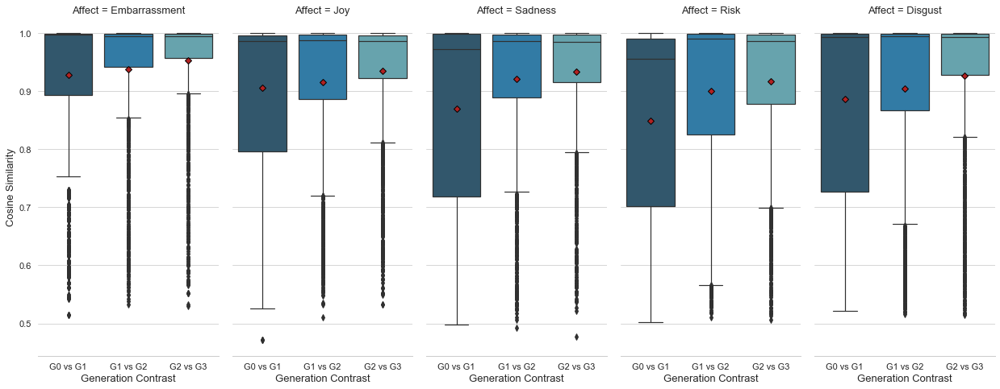

In [43]:
sns.set(style="whitegrid")
sns.set_context("paper", rc={"font.size":16,"axes.titlesize":13,"axes.labelsize":13,"xtick.labelsize":11,"ytick.labelsize":11}) 
#g = sns.catplot(x="Generation Contrast", y="Cosine Similarity", col="Level", row='Affect', palette="YlGnBu_d", col_order=["Low","Moderate","High"], height=6, aspect=.75,
#                kind="box", data=between_cs_l)
meanpointprops = dict(marker='D', markeredgecolor='black',markerfacecolor='firebrick')
g = sns.catplot(x="Generation Contrast", y="Cosine Similarity", col='Affect', col_order=['Embarrassment','Joy','Sadness','Risk','Disgust'], palette="YlGnBu_d", height=7, aspect=.5,
                kind="box", meanline=False, showmeans=True, meanprops=meanpointprops, data=between_cs_l)
g.despine(left=True)
#g.savefig("768CSbetweenG011223.png")

In [5]:
d=[]

# GO by emotions
g0_name = g0PooledEmbeddings[:521] #arnold
g0_name_edm = cosine_distances(g0_name, g0_name)
d.append(max(g0_name_edm[np.triu_indices(len(g0_name_edm), k = 1)]))
print("=== G0 Max Cosine Distance ===")
print(max(g0_name_edm[np.triu_indices(len(g0_name_edm), k = 1)]))
print("        ")

# G1 by emotions
g1_name = g1PooledEmbeddings[:521] #arnold
g1_name_edm = cosine_distances(g1_name, g1_name)
d.append(max(g1_name_edm[np.triu_indices(len(g1_name_edm), k = 1)]))
print("=== G1 Max Cosine Distance ===")
print(max(g1_name_edm[np.triu_indices(len(g1_name_edm), k = 1)]))
print("        ")

# G2 by emotions
g2_name = g2PooledEmbeddings[:521] #arnold
g2_name_edm = cosine_distances(g2_name, g2_name)
d.append(max(g2_name_edm[np.triu_indices(len(g2_name_edm), k = 1)]))
print("=== G2 Max Cosine Distance ===")
print(max(g2_name_edm[np.triu_indices(len(g2_name_edm), k = 1)]))
print("        ")

# G3 by emotions
g3_name = g3PooledEmbeddings[:521] #arnold
g3_name_edm = cosine_distances(g3_name, g3_name)
d.append(max(g3_name_edm[np.triu_indices(len(g3_name_edm), k = 1)]))
print("=== G3 Max Cosine Distance ===")
print(max(g3_name_edm[np.triu_indices(len(g3_name_edm), k = 1)]))
print("        ")


=== G0 Max Cosine Distance ===
0.43957642461120994
        
=== G1 Max Cosine Distance ===
0.47663298778446395
        
=== G2 Max Cosine Distance ===
0.47796052730411354
        
=== G3 Max Cosine Distance ===
0.49079144987012424
        


In [16]:
disgust = 1673
embarrassment = 3362
joy = 5054
risk = 6817
sadness = 8576

d,e,j,r,s=[],[],[],[],[]

# GO by emotions
g0_dis_e, g0_emb_e = g0PooledEmbeddings[:disgust], g0PooledEmbeddings[disgust+1:embarrassment] 
g0_joy_e, g0_ris_e, g0_sad_e = g0PooledEmbeddings[embarrassment+1:joy], g0PooledEmbeddings[joy+1:risk], g0PooledEmbeddings[risk+1:sadness]

#g0_dis_edm = euclidean_distances(g0_dis_e, g0_dis_e)
#g0_emb_edm = euclidean_distances(g0_emb_e, g0_emb_e)
#g0_joy_edm = euclidean_distances(g0_joy_e, g0_joy_e)
#g0_ris_edm = euclidean_distances(g0_ris_e, g0_ris_e)
#g0_sad_edm = euclidean_distances(g0_sad_e, g0_sad_e)
g0_dis_edm = cosine_distances(g0_dis_e, g0_dis_e)
g0_emb_edm = cosine_distances(g0_emb_e, g0_emb_e)
g0_joy_edm = cosine_distances(g0_joy_e, g0_joy_e)
g0_ris_edm = cosine_distances(g0_ris_e, g0_ris_e)
g0_sad_edm = cosine_distances(g0_sad_e, g0_sad_e)

d.append(max(g0_dis_edm[np.triu_indices(len(g0_dis_edm), k = 1)]))
e.append(max(g0_emb_edm[np.triu_indices(len(g0_emb_edm), k = 1)]))
j.append(max(g0_joy_edm[np.triu_indices(len(g0_joy_edm), k = 1)]))
r.append(max(g0_ris_edm[np.triu_indices(len(g0_ris_edm), k = 1)]))
s.append(max(g0_sad_edm[np.triu_indices(len(g0_sad_edm), k = 1)]))

#print("=== G0 Max Euclidean Distance ===")
print("=== G0 Max Cosine Distance ===")
print("Disgust:",max(g0_dis_edm[np.triu_indices(len(g0_dis_edm), k = 1)]))
print("Embarrassment:",max(g0_emb_edm[np.triu_indices(len(g0_emb_edm), k = 1)]))
print("Joy:",max(g0_joy_edm[np.triu_indices(len(g0_joy_edm), k = 1)]))
print("Risk:",max(g0_ris_edm[np.triu_indices(len(g0_ris_edm), k = 1)]))
print("Sadness:",max(g0_sad_edm[np.triu_indices(len(g0_sad_edm), k = 1)]))
print("        ")

# G1 by emotions
g1_dis_e, g1_emb_e = g1PooledEmbeddings[:disgust], g1PooledEmbeddings[disgust+1:embarrassment] 
g1_joy_e, g1_ris_e, g1_sad_e = g1PooledEmbeddings[embarrassment+1:joy], g1PooledEmbeddings[joy+1:risk], g1PooledEmbeddings[risk+1:sadness]

#g1_dis_edm = euclidean_distances(g1_dis_e, g1_dis_e)
#g1_emb_edm = euclidean_distances(g1_emb_e, g1_emb_e)
#g1_joy_edm = euclidean_distances(g1_joy_e, g1_joy_e)
#g1_ris_edm = euclidean_distances(g1_ris_e, g1_ris_e)
#g1_sad_edm = euclidean_distances(g1_sad_e, g1_sad_e)
g1_dis_edm = cosine_distances(g1_dis_e, g1_dis_e)
g1_emb_edm = cosine_distances(g1_emb_e, g1_emb_e)
g1_joy_edm = cosine_distances(g1_joy_e, g1_joy_e)
g1_ris_edm = cosine_distances(g1_ris_e, g1_ris_e)
g1_sad_edm = cosine_distances(g1_sad_e, g1_sad_e)

d.append(max(g1_dis_edm[np.triu_indices(len(g1_dis_edm), k = 1)]))
e.append(max(g1_emb_edm[np.triu_indices(len(g1_emb_edm), k = 1)]))
j.append(max(g1_joy_edm[np.triu_indices(len(g1_joy_edm), k = 1)]))
r.append(max(g1_ris_edm[np.triu_indices(len(g1_ris_edm), k = 1)]))
s.append(max(g1_sad_edm[np.triu_indices(len(g1_sad_edm), k = 1)]))

#print("=== G1 Max Euclidean Distance ===")
print("=== G1 Max Cosine Distance ===")
print("Disgust:",max(g1_dis_edm[np.triu_indices(len(g1_dis_edm), k = 1)]))
print("Embarrassment:",max(g1_emb_edm[np.triu_indices(len(g1_emb_edm), k = 1)]))
print("Joy:",max(g1_joy_edm[np.triu_indices(len(g1_joy_edm), k = 1)]))
print("Risk:",max(g1_ris_edm[np.triu_indices(len(g1_ris_edm), k = 1)]))
print("Sadness:",max(g1_sad_edm[np.triu_indices(len(g1_sad_edm), k = 1)]))
print("        ")

# G2 by emotions
g2_dis_e, g2_emb_e = g2PooledEmbeddings[:disgust], g2PooledEmbeddings[disgust+1:embarrassment] 
g2_joy_e, g2_ris_e, g2_sad_e = g2PooledEmbeddings[embarrassment+1:joy], g2PooledEmbeddings[joy+1:risk], g2PooledEmbeddings[risk+1:sadness]

#g2_dis_edm = euclidean_distances(g2_dis_e, g2_dis_e)
#g2_emb_edm = euclidean_distances(g2_emb_e, g2_emb_e)
#g2_joy_edm = euclidean_distances(g2_joy_e, g2_joy_e)
#g2_ris_edm = euclidean_distances(g2_ris_e, g2_ris_e)
#g2_sad_edm = euclidean_distances(g2_sad_e, g2_sad_e)
g2_dis_edm = cosine_distances(g2_dis_e, g2_dis_e)
g2_emb_edm = cosine_distances(g2_emb_e, g2_emb_e)
g2_joy_edm = cosine_distances(g2_joy_e, g2_joy_e)
g2_ris_edm = cosine_distances(g2_ris_e, g2_ris_e)
g2_sad_edm = cosine_distances(g2_sad_e, g2_sad_e)

d.append(max(g2_dis_edm[np.triu_indices(len(g2_dis_edm), k = 1)]))
e.append(max(g2_emb_edm[np.triu_indices(len(g2_emb_edm), k = 1)]))
j.append(max(g2_joy_edm[np.triu_indices(len(g2_joy_edm), k = 1)]))
r.append(max(g2_ris_edm[np.triu_indices(len(g2_ris_edm), k = 1)]))
s.append(max(g2_sad_edm[np.triu_indices(len(g2_sad_edm), k = 1)]))

#print("=== G2 Max Euclidean Distance ===")
print("=== G2 Max Cosine Distance ===")
print("Disgust:",max(g2_dis_edm[np.triu_indices(len(g2_dis_edm), k = 1)]))
print("Embarrassment:",max(g2_emb_edm[np.triu_indices(len(g2_emb_edm), k = 1)]))
print("Joy:",max(g2_joy_edm[np.triu_indices(len(g2_joy_edm), k = 1)]))
print("Risk:",max(g2_ris_edm[np.triu_indices(len(g2_ris_edm), k = 1)]))
print("Sadness:",max(g2_sad_edm[np.triu_indices(len(g2_sad_edm), k = 1)]))
print("        ")

# G3 by emotions
g3_dis_e, g3_emb_e = g3PooledEmbeddings[:disgust], g3PooledEmbeddings[disgust+1:embarrassment] 
g3_joy_e, g3_ris_e, g3_sad_e = g3PooledEmbeddings[embarrassment+1:joy], g3PooledEmbeddings[joy+1:risk], g3PooledEmbeddings[risk+1:sadness]

#g3_dis_edm = euclidean_distances(g3_dis_e, g3_dis_e)
#g3_emb_edm = euclidean_distances(g3_emb_e, g3_emb_e)
#g3_joy_edm = euclidean_distances(g3_joy_e, g3_joy_e)
#g3_ris_edm = euclidean_distances(g3_ris_e, g3_ris_e)
#g3_sad_edm = euclidean_distances(g3_sad_e, g3_sad_e)
g3_dis_edm = cosine_distances(g3_dis_e, g3_dis_e)
g3_emb_edm = cosine_distances(g3_emb_e, g3_emb_e)
g3_joy_edm = cosine_distances(g3_joy_e, g3_joy_e)
g3_ris_edm = cosine_distances(g3_ris_e, g3_ris_e)
g3_sad_edm = cosine_distances(g3_sad_e, g3_sad_e)

d.append(max(g3_dis_edm[np.triu_indices(len(g3_dis_edm), k = 1)]))
e.append(max(g3_emb_edm[np.triu_indices(len(g3_emb_edm), k = 1)]))
j.append(max(g3_joy_edm[np.triu_indices(len(g3_joy_edm), k = 1)]))
r.append(max(g3_ris_edm[np.triu_indices(len(g3_ris_edm), k = 1)]))
s.append(max(g3_sad_edm[np.triu_indices(len(g3_sad_edm), k = 1)]))

#print("=== G3 Max Euclidean Distance ===")
print("=== G3 Max Cosine Distance ===")
print("Disgust:",max(g3_dis_edm[np.triu_indices(len(g3_dis_edm), k = 1)]))
print("Embarrassment:",max(g3_emb_edm[np.triu_indices(len(g3_emb_edm), k = 1)]))
print("Joy:",max(g3_joy_edm[np.triu_indices(len(g3_joy_edm), k = 1)]))
print("Risk:",max(g3_ris_edm[np.triu_indices(len(g3_ris_edm), k = 1)]))
print("Sadness:",max(g3_sad_edm[np.triu_indices(len(g3_sad_edm), k = 1)]))

=== G0 Max Cosine Distance ===
Disgust: 0.4583688479888942
Embarrassment: 0.43451244031089986
Joy: 0.48673686876357536
Risk: 0.4583575389071979
Sadness: 0.4533417758553149
        
=== G1 Max Cosine Distance ===
Disgust: 0.4886474365692052
Embarrassment: 0.5586037131234939
Joy: 0.542452130837595
Risk: 0.5130477329851864
Sadness: 0.5264224639715072
        
=== G2 Max Cosine Distance ===
Disgust: 0.5278223899148067
Embarrassment: 0.5345210423747715
Joy: 0.5219013832153132
Risk: 0.5210915914559624
Sadness: 0.5390094662579199
        
=== G3 Max Cosine Distance ===
Disgust: 0.5310930339906553
Embarrassment: 0.5287693973520484
Joy: 0.5246803418423265
Risk: 0.5324707457246776
Sadness: 0.5413180231499193


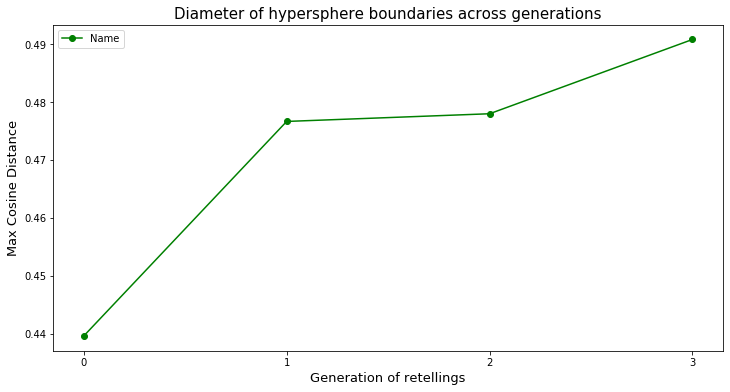

In [6]:
plt.figure(figsize=(12,6))
plt.plot(d, 'g-o', label="Name")
plt.plot(d, 'g-o', label="Disgust")
plt.plot(e, 'b-o', label="Embarrassment")
plt.plot(j, 'y-o', label="Joy")
plt.plot(r, 'r-o', label="Risk")
plt.plot(s, 'k-o', label="Sadness")
plt.title("Diameter of hypersphere boundaries across generations",fontsize=15)
plt.xlabel("Generation of retellings",fontsize=13)
#plt.ylabel("Max Euclidean Distance",fontsize=13)
plt.ylabel("Max Cosine Distance",fontsize=13)
plt.legend()
plt.xticks(list(range(4)))
plt.show()

In [6]:
#g0ed_matrix = euclidean_distances(g0PooledEmbeddings, g0PooledEmbeddings)
#g1ed_matrix = euclidean_distances(g1PooledEmbeddings, g1PooledEmbeddings)
#g2ed_matrix = euclidean_distances(g2PooledEmbeddings, g2PooledEmbeddings)
#g3ed_matrix = euclidean_distances(g3PooledEmbeddings, g3PooledEmbeddings)

#g0cs_matrix = cosine_similarity(g0PooledEmbeddings, g0PooledEmbeddings)
#g1cs_matrix = cosine_similarity(g1PooledEmbeddings, g1PooledEmbeddings)
#g2cs_matrix = cosine_similarity(g2PooledEmbeddings, g2PooledEmbeddings)
#g3cs_matrix = cosine_similarity(g3PooledEmbeddings, g3PooledEmbeddings)

#g0g1ed = euclidean_distances(g0PooledEmbeddings, g1PooledEmbeddings).diagonal()
#g1g2ed = euclidean_distances(g1PooledEmbeddings, g2PooledEmbeddings).diagonal()
#g2g3ed = euclidean_distances(g2PooledEmbeddings, g3PooledEmbeddings).diagonal()

#g0g2ed = euclidean_distances(g0PooledEmbeddings, g2PooledEmbeddings).diagonal()
#g0g3ed = euclidean_distances(g0PooledEmbeddings, g3PooledEmbeddings).diagonal()
#g1g3ed = euclidean_distances(g1PooledEmbeddings, g3PooledEmbeddings).diagonal()

In [7]:
#print(max(g0ed_matrix[np.triu_indices(len(g0ed_matrix), k = 1)]))
#print(max(g1ed_matrix[np.triu_indices(len(g1ed_matrix), k = 1)]))
#print(max(g2ed_matrix[np.triu_indices(len(g2ed_matrix), k = 1)]))
#print(max(g3ed_matrix[np.triu_indices(len(g3ed_matrix), k = 1)]))

In [8]:
#g0g1cs = cosine_similarity(g0PooledEmbeddings, g1PooledEmbeddings).diagonal()
#g1g2cs = cosine_similarity(g1PooledEmbeddings, g2PooledEmbeddings).diagonal()
#g2g3cs = cosine_similarity(g2PooledEmbeddings, g3PooledEmbeddings).diagonal()

#g0g2cs = cosine_similarity(g0PooledEmbeddings, g2PooledEmbeddings).diagonal()
#g0g3cs = cosine_similarity(g0PooledEmbeddings, g3PooledEmbeddings).diagonal()
#g1g3cs = cosine_similarity(g1PooledEmbeddings, g3PooledEmbeddings).diagonal()

In [7]:
#def create_affect_level_class(affect_rating):
#    affect_level = []
#    for i, rating in enumerate(affect_rating):
#        if rating < 7/3:
#            affect_level.append(g0df['Affect'][i]+' Low')
#        elif rating > 14/3:
#            affect_level.append(g0df['Affect'][i]+' High')
#        else: # Imputes moderate class for NaN values
#            affect_level.append(g0df['Affect'][i]+' Moderate')
#    return np.array(affect_level) # Length of 8576

#g0_affect_level = create_affect_level_class(g0df['Affect Rating'])
#g1_affect_level = create_affect_level_class(g1df['G1 Affect Rating'])
#g2_affect_level = create_affect_level_class(g2df['G2 Affect Rating'])
#g3_affect_level = create_affect_level_class(g3df['G3 Affect Rating'])

In [8]:
#df.insert(4, "G0 Affect Level", g0_affect_level)
#df.insert(5, "G1 Affect Level", g1_affect_level)
#df.insert(6, "G2 Affect Level", g2_affect_level)
#df.insert(7, "G3 Affect Level", g3_affect_level)


In [9]:
#df.insert(45, "G0-G1 ED", g0g1ed)
#df.insert(46, "G1-G2 ED", g1g2ed)
#df.insert(47, "G2-G3 ED", g2g3ed)

#df.insert(48, "G0-G2 ED", g0g2ed)
#df.insert(49, "G0-G3 ED", g0g3ed)
#df.insert(50, "G1-G3 ED", g1g3ed)

#df.insert(51, "G0-G1 CS", g0g1cs)
#df.insert(52, "G1-G2 CS", g1g2cs)
#df.insert(53, "G2-G3 CS", g2g3cs)

#df.insert(54, "G0-G2 CS", g0g2cs)
#df.insert(55, "G0-G3 CS", g0g3cs)
#df.insert(56, "G1-G3 CS", g1g3cs)

#df.to_csv('changedoriginalratings0MasterAffectEventReducedV2.csv')

In [5]:
from sklearn.decomposition import PCA, KernelPCA
#from sklearn.neighbors import NearestCentroid

#def features_to_components_and_centroids(features, centroid_labels, n_components, kernel):
def features_to_components(features, n_components, kernel):
    pca = KernelPCA(n_components=n_components,kernel=kernel)
    projected = pca.fit_transform(features)
    # Find centroids of clusters
    #clf = NearestCentroid()
    #clf.fit(projected, centroid_labels)
    #return projected, clf.centroids_
    return projected

In [12]:
pca99 = PCA(n_components = 0.95)
pca99.fit(g3PooledEmbeddings)
print("Number of components that explains 99% of variance: ",pca99.n_components_)

Number of components that explains 99% of variance:  13


In [18]:
g1projected_8 = features_to_components(g1PooledEmbeddings, 15, 'linear')
#g1projected_8 = allprojected

g1_affect_rating = g1df['G1 Affect Rating'].values
#g1_affect_rating = np.concatenate((g0df['Affect Rating'].values,g1df['G1 Affect Rating'].values,g2df['G2 Affect Rating'].values,g3df['G3 Affect Rating'].values),axis=0)
g1_wc = g1df['G1 WC'].values
g1_emotional_effect = g1df['G1 emotional effect'].values
g1_transport = g1df['G1 Transport'].values
g1_event_presence = g1df['G1 Event Presence'].values

corr_features = {'pc1':g1projected_8[:,0], 'pc2':g1projected_8[:,1], 'pc3':g1projected_8[:,2], 'pc4':g1projected_8[:,3], 
                 'pc5':g1projected_8[:,4], 'pc6':g1projected_8[:,5], 'pc7':g1projected_8[:,6], 'pc8':g1projected_8[:,7],
                 'pc9':g1projected_8[:,8], 'pc10':g1projected_8[:,9], 'pc11':g1projected_8[:,10], 'pc12':g1projected_8[:,11],
                 'pc13':g1projected_8[:,12], 'pc14':g1projected_8[:,13], 'pc15':g1projected_8[:,14],# 'pc16':g1projected_8[:,15],
                 #'pc17':g1projected_8[:,16], 'pc18':g1projected_8[:,17], 'pc19':g1projected_8[:,18], 'pc20':g1projected_8[:,19],
                'g1_affect_rating':g1_affect_rating, 'g1_wc':g1_wc, 'g1_emotional_effect':g1_emotional_effect,
                'g1_transport':g1_transport, 'g1_event_presence':g1_event_presence}

In [20]:
g1projected_8 = features_to_components(g3PooledEmbeddings, 15, 'linear')
#g1projected_8 = allprojected

g1_affect_rating = g3df['G3 Affect Rating'].values
#g1_affect_rating = np.concatenate((g0df['Affect Rating'].values,g1df['G1 Affect Rating'].values,g2df['G2 Affect Rating'].values,g3df['G3 Affect Rating'].values),axis=0)
g1_wc = g3df['G3 WC'].values
g1_emotional_effect = g3df['G3 emotional effect'].values
g1_transport = g3df['G3 Transport'].values
g1_event_presence = g3df['G3 Event Presence'].values

corr_features = {'pc1':g1projected_8[:,0], 'pc2':g1projected_8[:,1], 'pc3':g1projected_8[:,2], 'pc4':g1projected_8[:,3], 
                 'pc5':g1projected_8[:,4], 'pc6':g1projected_8[:,5], 'pc7':g1projected_8[:,6], 'pc8':g1projected_8[:,7],
                 'pc9':g1projected_8[:,8], 'pc10':g1projected_8[:,9], 'pc11':g1projected_8[:,10], 'pc12':g1projected_8[:,11],
                 'pc13':g1projected_8[:,12], 'pc14':g1projected_8[:,13], 'pc15':g1projected_8[:,14],# 'pc16':g1projected_8[:,15],
                 #'pc17':g1projected_8[:,16], 'pc18':g1projected_8[:,17], 'pc19':g1projected_8[:,18], 'pc20':g1projected_8[:,19],
                'g1_affect_rating':g1_affect_rating, 'g1_wc':g1_wc, 'g1_emotional_effect':g1_emotional_effect,
                'g1_transport':g1_transport, 'g1_event_presence':g1_event_presence}

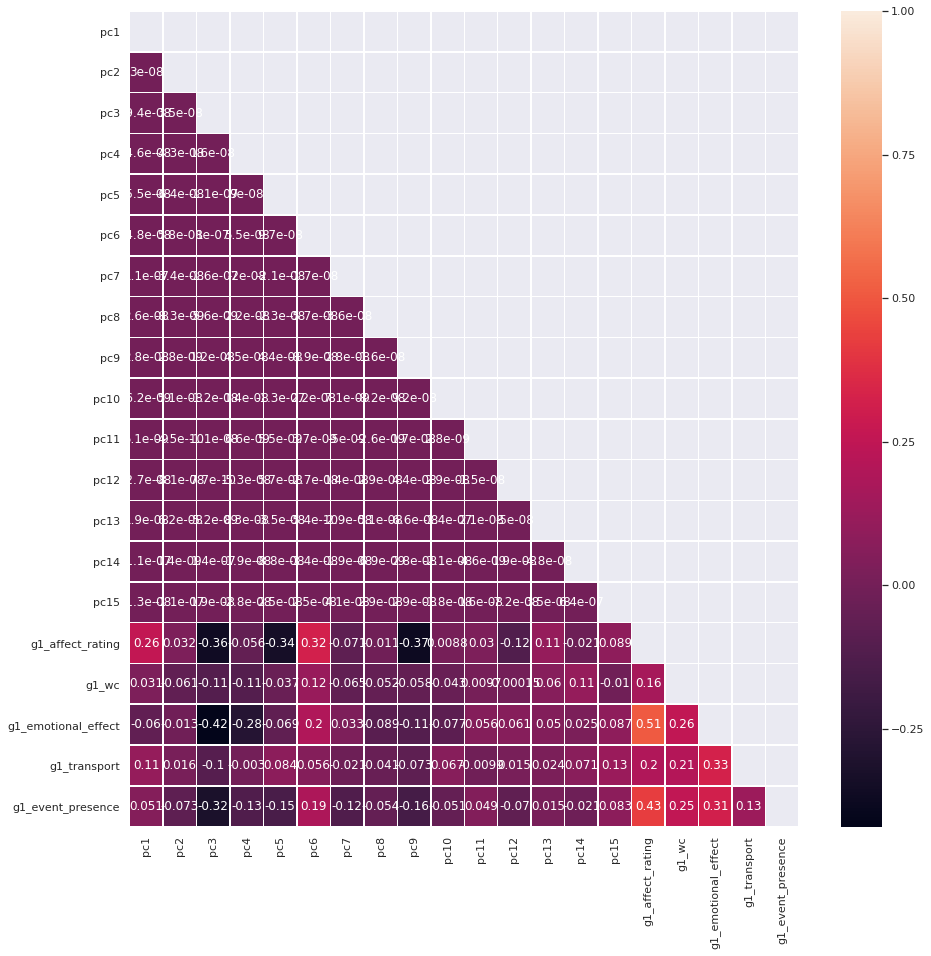

In [21]:
corr_features = pd.DataFrame.from_dict(corr_features)
# Plot the correlation coefficient matrix as a heat map
corr = corr_features.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
sns.set()
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corr, mask=mask, annot=True, linewidths=.5, ax=ax)

In [42]:
g1projected_8 = features_to_components(g1PooledEmbeddings, 15, 'cosine')

g1_affect_rating = g1df['G1 Affect Rating'].values
g1_wc = g1df['G1 WC'].values
g1_emotional_effect = g1df['G1 emotional effect'].values
g1_transport = g1df['G1 Transport'].values
g1_event_presence = g1df['G1 Event Presence'].values

corr_features = {'pc1':g1projected_8[:,0], 'pc2':g1projected_8[:,1], 'pc3':g1projected_8[:,2], 'pc4':g1projected_8[:,3], 
                 'pc5':g1projected_8[:,4], 'pc6':g1projected_8[:,5], 'pc7':g1projected_8[:,6], 'pc8':g1projected_8[:,7],
                 'pc9':g1projected_8[:,8], 'pc10':g1projected_8[:,9], 'pc11':g1projected_8[:,10], 'pc12':g1projected_8[:,11],
                 'pc13':g1projected_8[:,12], 'pc14':g1projected_8[:,13], 'pc15':g1projected_8[:,14],# 'pc16':g1projected_8[:,15],
                 #'pc17':g1projected_8[:,16], 'pc18':g1projected_8[:,17], 'pc19':g1projected_8[:,18], 'pc20':g1projected_8[:,19],
                'g1_affect_rating':g1_affect_rating, 'g1_wc':g1_wc, 'g1_emotional_effect':g1_emotional_effect,
                'g1_transport':g1_transport, 'g1_event_presence':g1_event_presence}

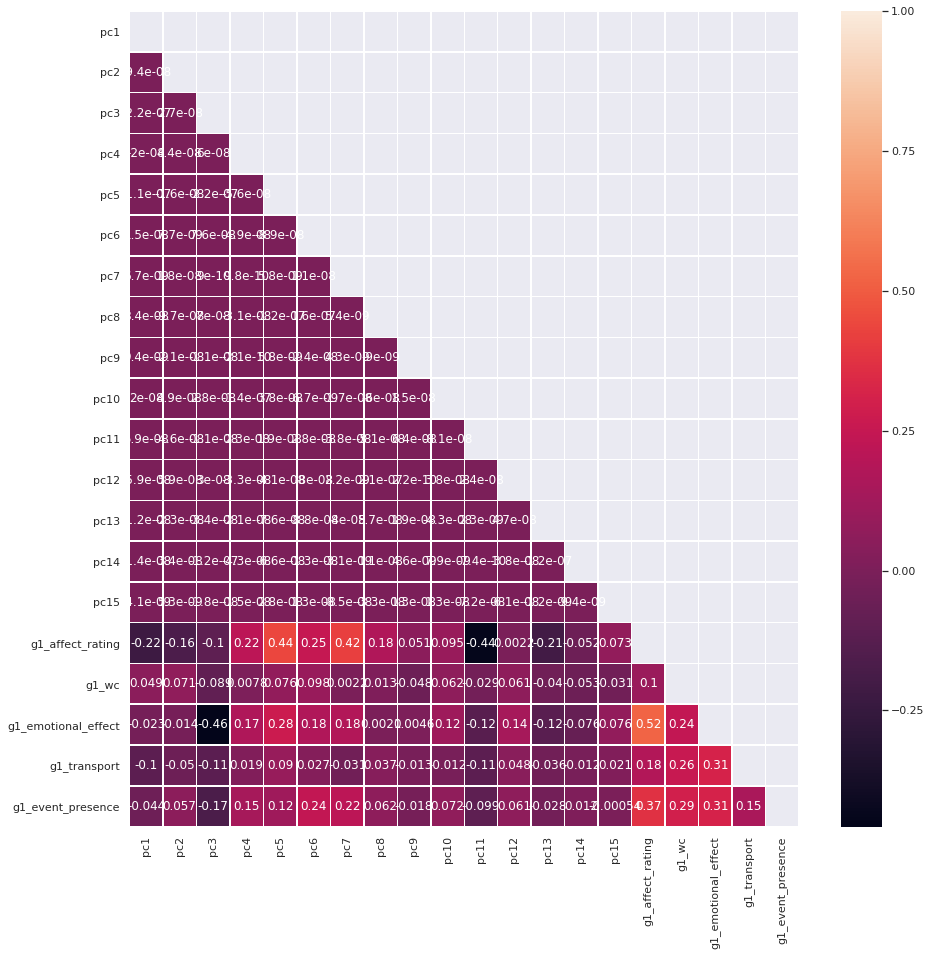

In [43]:
corr_features = pd.DataFrame.from_dict(corr_features)
# Plot the correlation coefficient matrix as a heat map
corr = corr_features.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
sns.set()
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corr, mask=mask, annot=True, linewidths=.5, ax=ax)

In [47]:
#allprojected = features_to_components(np.concatenate((g0PooledEmbeddings, g1PooledEmbeddings, g2PooledEmbeddings, g3PooledEmbeddings), axis=0),
#                                      15, 'linear')

In [47]:
allPooledEmbeddings = np.concatenate((g0PooledEmbeddings, g1PooledEmbeddings, g2PooledEmbeddings, g3PooledEmbeddings), axis=0)
pca99 = PCA(n_components = 0.99)
pca99.fit(allPooledEmbeddings)
print("Number of components that explains 99% of variance: ",pca99.n_components_)
allprojected = pca99.transform(allPooledEmbeddings)

Number of components that explains 99% of variance:  27


In [15]:
#with open("allembeddingspc.pkl",'wb') as file:
#    pickle.dump(allprojected, file)
#with open("allembeddingspc.pkl", 'rb') as file:
#    allprojected = pickle.load(file)

In [6]:
#np.savetxt("allPooledEmbeddings.csv", allPooledEmbeddings, delimiter=",")
#np.savetxt("allprojected.csv", allprojected, delimiter=",")
#allPooledEmbeddings = np.genfromtxt('allPooledEmbeddings.csv', delimiter=',')
allprojected = np.genfromtxt('allprojected.csv', delimiter=',')
g0projected = allprojected[:8576]
print(len(g0projected))
g1projected = allprojected[8576:17152]
print(len(g1projected))
g2projected = allprojected[17152:25728]
print(len(g2projected))
g3projected = allprojected[25728:]
print(len(g3projected))

8576
8576
8576
8576


In [7]:
all_affect_rating = np.concatenate((df['Affect Rating'].values,df['G1 Affect Rating'].values,df['G2 Affect Rating'].values,df['G3 Affect Rating'].values), axis=0)
#g1_affect_rating = np.concatenate((g0df['Affect Rating'].values,g1df['G1 Affect Rating'].values,g2df['G2 Affect Rating'].values,g3df['G3 Affect Rating'].values),axis=0)
#all_wc = g3df['G3 WC'].values
#g1_emotional_effect = g3df['G3 emotional effect'].values
#g1_transport = g3df['G3 Transport'].values
#all_event_presence = g3df['G3 Event Presence'].values

corr_features = {'pc1':allprojected[:,0], 'pc2':allprojected[:,1], 'pc3':allprojected[:,2], 'pc4':allprojected[:,3], 
                 'pc5':allprojected[:,4], 'pc6':allprojected[:,5], 'pc7':allprojected[:,6], 'pc8':allprojected[:,7],
                 'pc9':allprojected[:,8], 'pc10':allprojected[:,9], 'pc11':allprojected[:,10], 'pc12':allprojected[:,11],
                 'pc13':allprojected[:,12], 'pc14':allprojected[:,13], 'pc15':allprojected[:,14], 'pc16':allprojected[:,15],
                 'pc17':allprojected[:,16], 'pc18':allprojected[:,17], 'pc19':allprojected[:,18], 'pc20':allprojected[:,19],
                 'pc21':allprojected[:,20], 'pc22':allprojected[:,21], 'pc23':allprojected[:,22], 'pc24':allprojected[:,23],
                 'pc25':allprojected[:,24], 'pc26':allprojected[:,25], 'pc27':allprojected[:,26],# 'pc28':allprojected[:,19],
                'affect_rating':all_affect_rating}#, 'wc':all_wc, 'g1_emotional_effect':g1_emotional_effect,
                #'event_presence':all_event_presence, 'g1_transport':g1_transport}

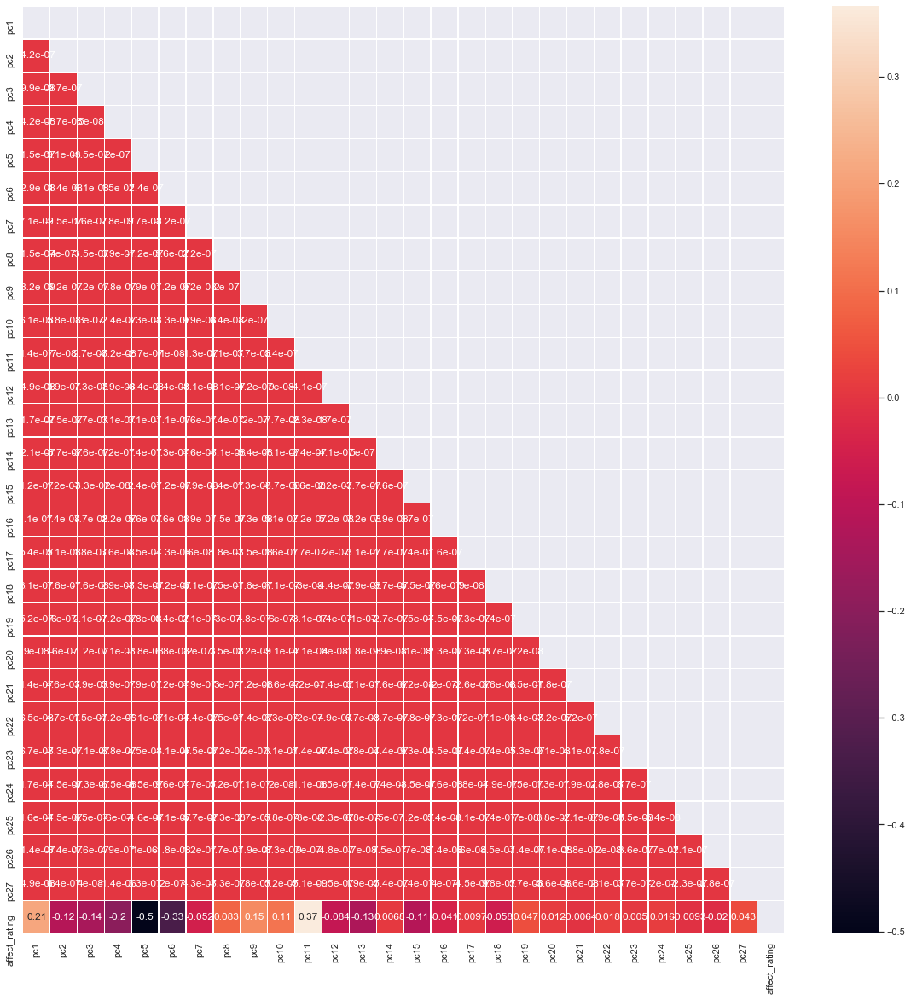

In [10]:
corr_features = pd.DataFrame.from_dict(corr_features)
# Plot the correlation coefficient matrix as a heat map
corr = corr_features.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
sns.set()
fig, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corr, mask=mask, annot=True, linewidths=.5, ax=ax)

In [8]:
from sklearn import preprocessing
all_affect = np.concatenate((df['G0 Affect Level'].values,df['G1 Affect Level'].values,df['G2 Affect Level'].values,df['G3 Affect Level'].values),axis=0)
lab_enc = preprocessing.LabelEncoder()
Y = lab_enc.fit_transform(all_affect)
le_name_mapping = dict(zip(lab_enc.classes_, lab_enc.transform(lab_enc.classes_)))
print(le_name_mapping)

{'DISGUST High': 0, 'DISGUST Low': 1, 'DISGUST Moderate': 2, 'EMBARESSMENT High': 3, 'EMBARESSMENT Low': 4, 'EMBARESSMENT Moderate': 5, 'JOY High': 6, 'JOY Low': 7, 'JOY Moderate': 8, 'RISK High': 9, 'RISK Low': 10, 'RISK Moderate': 11, 'SADNESS High': 12, 'SADNESS Low': 13, 'SADNESS Moderate': 14}


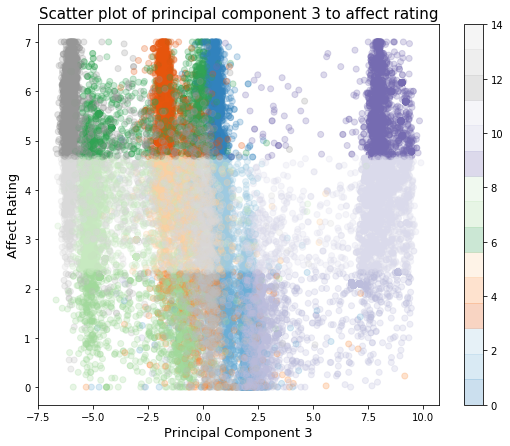

In [9]:
plotted_pc = 3
plt.figure(figsize=(9,7))
plt.title(f'Scatter plot of principal component {plotted_pc} to affect rating',fontsize=15)
plt.scatter(allprojected[:,plotted_pc-1],all_affect_rating,alpha=0.25,c=Y,cmap=plt.cm.get_cmap('tab20c', 15))
plt.colorbar()
plt.xlabel(f'Principal Component {plotted_pc}',fontsize=13)
plt.ylabel('Affect Rating',fontsize=13)
plt.show()


In [10]:
d,e,j,r,s=[],[],[],[],[]

# GO by emotions
g0_dis_e, g0_emb_e = g0projected[:disgust], g0projected[disgust+1:embarrassment] 
g0_joy_e, g0_ris_e, g0_sad_e = g0projected[embarrassment+1:joy], g0projected[joy+1:risk], g0projected[risk+1:sadness]

g0_dis_edm = euclidean_distances(g0_dis_e, g0_dis_e)
g0_emb_edm = euclidean_distances(g0_emb_e, g0_emb_e)
g0_joy_edm = euclidean_distances(g0_joy_e, g0_joy_e)
g0_ris_edm = euclidean_distances(g0_ris_e, g0_ris_e)
g0_sad_edm = euclidean_distances(g0_sad_e, g0_sad_e)

d.append(max(g0_dis_edm[np.triu_indices(len(g0_dis_edm), k = 1)]))
e.append(max(g0_emb_edm[np.triu_indices(len(g0_emb_edm), k = 1)]))
j.append(max(g0_joy_edm[np.triu_indices(len(g0_joy_edm), k = 1)]))
r.append(max(g0_ris_edm[np.triu_indices(len(g0_ris_edm), k = 1)]))
s.append(max(g0_sad_edm[np.triu_indices(len(g0_sad_edm), k = 1)]))

print("=== G0 Max Euclidean Distance ===")
print("Disgust:",max(g0_dis_edm[np.triu_indices(len(g0_dis_edm), k = 1)]))
print("Embarrassment:",max(g0_emb_edm[np.triu_indices(len(g0_emb_edm), k = 1)]))
print("Joy:",max(g0_joy_edm[np.triu_indices(len(g0_joy_edm), k = 1)]))
print("Risk:",max(g0_ris_edm[np.triu_indices(len(g0_ris_edm), k = 1)]))
print("Sadness:",max(g0_sad_edm[np.triu_indices(len(g0_sad_edm), k = 1)]))
print("        ")

# G1 by emotions
g1_dis_e, g1_emb_e = g1projected[:disgust], g1projected[disgust+1:embarrassment] 
g1_joy_e, g1_ris_e, g1_sad_e = g1projected[embarrassment+1:joy], g1projected[joy+1:risk], g1projected[risk+1:sadness]

g1_dis_edm = euclidean_distances(g1_dis_e, g1_dis_e)
g1_emb_edm = euclidean_distances(g1_emb_e, g1_emb_e)
g1_joy_edm = euclidean_distances(g1_joy_e, g1_joy_e)
g1_ris_edm = euclidean_distances(g1_ris_e, g1_ris_e)
g1_sad_edm = euclidean_distances(g1_sad_e, g1_sad_e)

d.append(max(g1_dis_edm[np.triu_indices(len(g1_dis_edm), k = 1)]))
e.append(max(g1_emb_edm[np.triu_indices(len(g1_emb_edm), k = 1)]))
j.append(max(g1_joy_edm[np.triu_indices(len(g1_joy_edm), k = 1)]))
r.append(max(g1_ris_edm[np.triu_indices(len(g1_ris_edm), k = 1)]))
s.append(max(g1_sad_edm[np.triu_indices(len(g1_sad_edm), k = 1)]))

print("=== G1 Max Euclidean Distance ===")
print("Disgust:",max(g1_dis_edm[np.triu_indices(len(g1_dis_edm), k = 1)]))
print("Embarrassment:",max(g1_emb_edm[np.triu_indices(len(g1_emb_edm), k = 1)]))
print("Joy:",max(g1_joy_edm[np.triu_indices(len(g1_joy_edm), k = 1)]))
print("Risk:",max(g1_ris_edm[np.triu_indices(len(g1_ris_edm), k = 1)]))
print("Sadness:",max(g1_sad_edm[np.triu_indices(len(g1_sad_edm), k = 1)]))
print("        ")

# G2 by emotions
g2_dis_e, g2_emb_e = g2projected[:disgust], g2projected[disgust+1:embarrassment] 
g2_joy_e, g2_ris_e, g2_sad_e = g2projected[embarrassment+1:joy], g2projected[joy+1:risk], g2projected[risk+1:sadness]

g2_dis_edm = euclidean_distances(g2_dis_e, g2_dis_e)
g2_emb_edm = euclidean_distances(g2_emb_e, g2_emb_e)
g2_joy_edm = euclidean_distances(g2_joy_e, g2_joy_e)
g2_ris_edm = euclidean_distances(g2_ris_e, g2_ris_e)
g2_sad_edm = euclidean_distances(g2_sad_e, g2_sad_e)

d.append(max(g2_dis_edm[np.triu_indices(len(g2_dis_edm), k = 1)]))
e.append(max(g2_emb_edm[np.triu_indices(len(g2_emb_edm), k = 1)]))
j.append(max(g2_joy_edm[np.triu_indices(len(g2_joy_edm), k = 1)]))
r.append(max(g2_ris_edm[np.triu_indices(len(g2_ris_edm), k = 1)]))
s.append(max(g2_sad_edm[np.triu_indices(len(g2_sad_edm), k = 1)]))

print("=== G2 Max Euclidean Distance ===")
print("Disgust:",max(g2_dis_edm[np.triu_indices(len(g2_dis_edm), k = 1)]))
print("Embarrassment:",max(g2_emb_edm[np.triu_indices(len(g2_emb_edm), k = 1)]))
print("Joy:",max(g2_joy_edm[np.triu_indices(len(g2_joy_edm), k = 1)]))
print("Risk:",max(g2_ris_edm[np.triu_indices(len(g2_ris_edm), k = 1)]))
print("Sadness:",max(g2_sad_edm[np.triu_indices(len(g2_sad_edm), k = 1)]))
print("        ")

# G3 by emotions
g3_dis_e, g3_emb_e = g3projected[:disgust], g3projected[disgust+1:embarrassment] 
g3_joy_e, g3_ris_e, g3_sad_e = g3projected[embarrassment+1:joy], g3projected[joy+1:risk], g3projected[risk+1:sadness]

g3_dis_edm = euclidean_distances(g3_dis_e, g3_dis_e)
g3_emb_edm = euclidean_distances(g3_emb_e, g3_emb_e)
g3_joy_edm = euclidean_distances(g3_joy_e, g3_joy_e)
g3_ris_edm = euclidean_distances(g3_ris_e, g3_ris_e)
g3_sad_edm = euclidean_distances(g3_sad_e, g3_sad_e)

d.append(max(g3_dis_edm[np.triu_indices(len(g3_dis_edm), k = 1)]))
e.append(max(g3_emb_edm[np.triu_indices(len(g3_emb_edm), k = 1)]))
j.append(max(g3_joy_edm[np.triu_indices(len(g3_joy_edm), k = 1)]))
r.append(max(g3_ris_edm[np.triu_indices(len(g3_ris_edm), k = 1)]))
s.append(max(g3_sad_edm[np.triu_indices(len(g3_sad_edm), k = 1)]))

print("=== G3 Max Euclidean Distance ===")
print("Disgust:",max(g3_dis_edm[np.triu_indices(len(g3_dis_edm), k = 1)]))
print("Embarrassment:",max(g3_emb_edm[np.triu_indices(len(g3_emb_edm), k = 1)]))
print("Joy:",max(g3_joy_edm[np.triu_indices(len(g3_joy_edm), k = 1)]))
print("Risk:",max(g3_ris_edm[np.triu_indices(len(g3_ris_edm), k = 1)]))
print("Sadness:",max(g3_sad_edm[np.triu_indices(len(g3_sad_edm), k = 1)]))

=== G0 Max Euclidean Distance ===
Disgust: 18.653006981696965
Embarrassment: 18.297305874162987
Joy: 18.254179105614377
Risk: 18.62432600893227
Sadness: 17.866445108850527
        
=== G1 Max Euclidean Distance ===
Disgust: 19.083850235000135
Embarrassment: 18.89441157713114
Joy: 18.857320474634843
Risk: 19.286040285637032
Sadness: 18.976876875331797
        
=== G2 Max Euclidean Distance ===
Disgust: 19.671765915344757
Embarrassment: 18.95370904787722
Joy: 19.097360907381074
Risk: 19.337974644228577
Sadness: 19.078859309276968
        
=== G3 Max Euclidean Distance ===
Disgust: 19.5702806683817
Embarrassment: 19.52833443726949
Joy: 19.35893564982178
Risk: 19.33145553330606
Sadness: 19.07329971468574


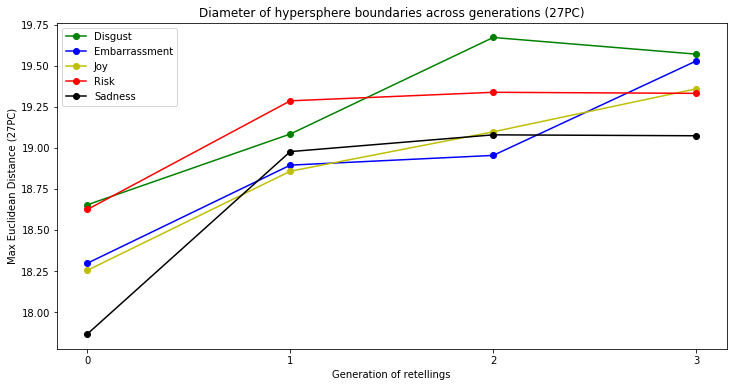

In [11]:
plt.figure(figsize=(12,6))

plt.plot(d, 'g-o', label="Disgust")
plt.plot(e, 'b-o', label="Embarrassment")
plt.plot(j, 'y-o', label="Joy")
plt.plot(r, 'r-o', label="Risk")
plt.plot(s, 'k-o', label="Sadness")
#plt.title("Diameter of hypersphere boundaries across generations (15PC)")
plt.title("Diameter of hypersphere boundaries across generations (27PC)")
plt.xlabel("Generation of retellings")
plt.ylabel("Max Euclidean Distance (27PC)")
plt.legend()
plt.xticks(list(range(4)))
plt.show()

In [104]:
#g0g1ed_pc27 = euclidean_distances(g0projected, g1projected).diagonal()
#g1g2ed_pc27 = euclidean_distances(g1projected, g2projected).diagonal()
#g2g3ed_pc27 = euclidean_distances(g2projected, g3projected).diagonal()

#g0g2ed_pc27 = euclidean_distances(g0projected, g2projected).diagonal()
#g0g3ed_pc27 = euclidean_distances(g0projected, g3projected).diagonal()
#g1g3ed_pc27 = euclidean_distances(g1projected, g3projected).diagonal()

In [46]:
#g0g1cs_pc15 = cosine_similarity(g0projected, g1projected).diagonal()
#g1g2cs_pc15 = cosine_similarity(g1projected, g2projected).diagonal()
#g2g3cs_pc15 = cosine_similarity(g2projected, g3projected).diagonal()

#g0g2cs_pc15 = cosine_similarity(g0projected, g2projected).diagonal()
#g0g3cs_pc15 = cosine_similarity(g0projected, g3projected).diagonal()
#g1g3cs_pc15 = cosine_similarity(g1projected, g3projected).diagonal()

In [106]:
#df.insert(73, "G0-G1 27PC ED", g0g1ed_pc27)
#df.insert(74, "G1-G2 27PC ED", g1g2ed_pc27)
#df.insert(74, "G2-G3 27PC ED", g2g3ed_pc27)

#df.insert(76, "G0-G2 27PC ED", g0g2ed_pc27)
#df.insert(77, "G0-G3 27PC ED", g0g3ed_pc27)
#df.insert(78, "G1-G3 27PC ED", g1g3ed_pc27)

#df.insert(67, "G0-G1 15PC CS", g0g1cs_pc15)
#df.insert(68, "G1-G2 15PC CS", g1g2cs_pc15)
#df.insert(69, "G2-G3 15PC CS", g2g3cs_pc15)

#df.insert(70, "G0-G2 15PC CS", g0g2cs_pc15)
#df.insert(71, "G0-G3 15PC CS", g0g3cs_pc15)
#df.insert(72, "G1-G3 15PC CS", g1g3cs_pc15)
#df.columns
#df.to_csv('changedoriginalratings0MasterAffectEventReducedV2.csv')

In [51]:
x_var="G1-G2 CS"
x_var2="G2-G3 CS"
x_var3="G0-G1 CS"
y_var="G1 Affect Level"

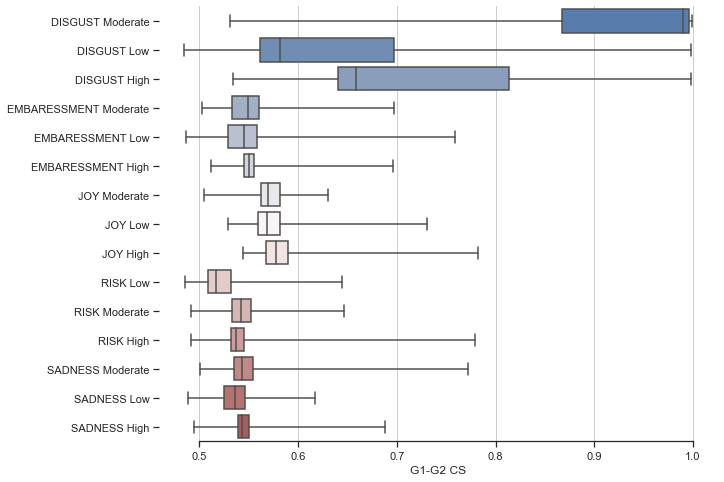

In [55]:
sns.set(style="ticks")

# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(figsize=(10, 8))
#ax.set_xscale("log")

# Plot the orbital period with horizontal boxes
sns.boxplot(x=x_var, y=y_var, data=g0df,
            whis=[0, 100], palette="vlag")

# Add in points to show each observation
#sns.swarmplot(x=x_var, y=y_var, data=g0df,
#              size=2, color=".3", linewidth=0)

# Tweak the visual presentation
ax.xaxis.grid(True)
ax.set(ylabel="")
sns.despine(trim=True, left=True)

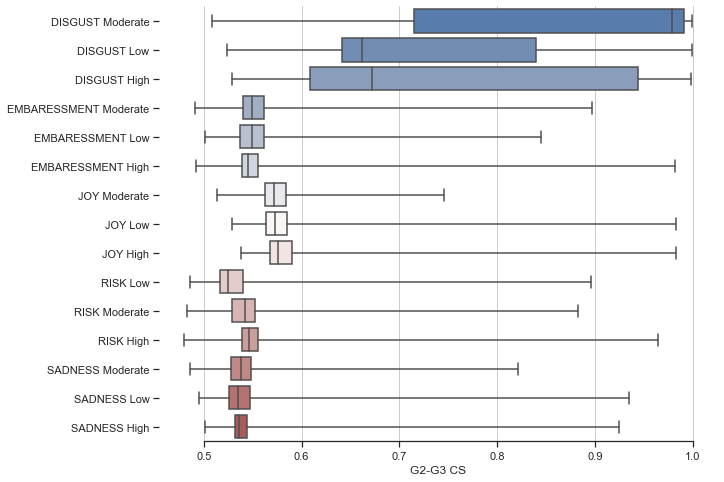

In [56]:
sns.set(style="ticks")

# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(figsize=(10, 8))
#ax.set_xscale("log")

# Plot the orbital period with horizontal boxes
sns.boxplot(x=x_var2, y=y_var, data=g0df,
            whis=[0, 100], palette="vlag")

# Add in points to show each observation
#sns.swarmplot(x=x_var2, y=y_var, data=g0df,
#              size=2, color=".3", linewidth=0)

# Tweak the visual presentation
ax.xaxis.grid(True)
ax.set(ylabel="")
sns.despine(trim=True, left=True)

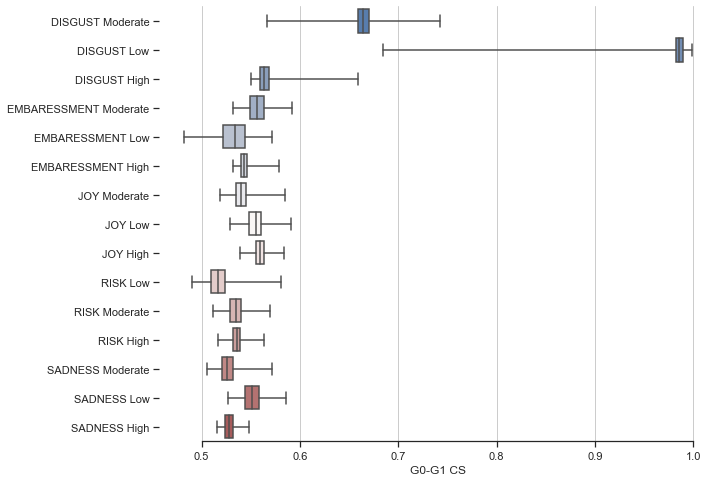

In [57]:
sns.set(style="ticks")

# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(figsize=(10, 8))
#ax.set_xscale("log")

# Plot the orbital period with horizontal boxes
sns.boxplot(x=x_var3, y=y_var, data=g0df,
            whis=[0, 100], palette="vlag")

# Add in points to show each observation
#sns.swarmplot(x=x_var3, y=y_var, data=g0df,
#              size=2, color=".3", linewidth=0)

# Tweak the visual presentation
ax.xaxis.grid(True)
ax.set(ylabel="")
sns.despine(trim=True, left=True)

In [12]:
from sklearn import metrics, preprocessing
#le = preprocessing.LabelBinarizer()
#y = le.inverse_transform(np.array(g2_affect_level[embarrassment+1:joy]))
lab_enc = preprocessing.LabelEncoder()
Y = lab_enc.fit_transform(g0df['Original StoryID'].values[embarrassment+1:joy])

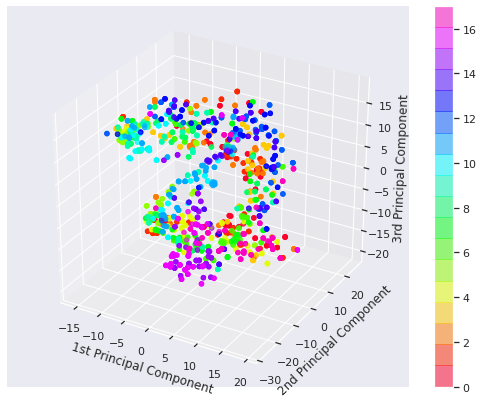

In [27]:
from mpl_toolkits import mplot3d

# Create the figure
fig = plt.figure(figsize=(9,7))
ax = plt.axes(projection='3d')

# Plot the values
ax.scatter3D(X_embedded[:, 0], X_embedded[:, 1], X_embedded[:, 2],
            c=Y, alpha=0.5,
            cmap=plt.cm.get_cmap('gist_rainbow', 18));
ax.set_xlabel('1st Principal Component')
ax.set_ylabel('2nd Principal Component')
ax.set_zlabel('3rd Principal Component')
fig.colorbar(ax.scatter3D(X_embedded[:, 0], X_embedded[:, 1], X_embedded[:, 2],
            c=Y, alpha=0.5,
            cmap=plt.cm.get_cmap('gist_rainbow', 18)))

In [15]:
from sklearn.manifold import MDS

lab_enc = preprocessing.LabelEncoder()
#Y = lab_enc.fit_transform(g0df['Original StoryID'].values[:arnold])
Y = lab_enc.fit_transform(np.concatenate((g0df['Original StoryID'].values[claire+1:emily],g0df['Original StoryID'].values[claire+1:emily],g0df['Original StoryID'].values[claire+1:emily],g0df['Original StoryID'].values[claire+1:emily]),axis=0))

#X_embedded = MDS(n_components=3).fit_transform(g3projected[:arnold])
X_embedded = MDS(n_components=3).fit_transform(np.concatenate((g0projected[claire+1:emily],g1projected[claire+1:emily],g2projected[claire+1:emily],g3projected[claire+1:emily]),axis=0))
plt.figure(figsize=(8,6))
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], c=Y, edgecolor='none', alpha=0.5, cmap=plt.cm.get_cmap('gist_rainbow', 5))
plt.colorbar()
plt.gca().set_aspect('equal', 'datalim')
plt.title('MDS projection of tuned RoBerta Embeddings', fontsize=24)

KeyboardInterrupt: 

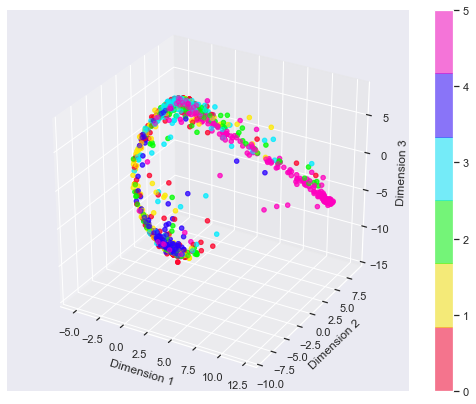

In [37]:
from mpl_toolkits import mplot3d
# Create the figure
fig = plt.figure(figsize=(9,7))
ax = plt.axes(projection='3d')

# Plot the values
ax.scatter3D(X_embedded[:, 0], X_embedded[:, 1], X_embedded[:, 2],
            c=Y, alpha=0.5,
            cmap=plt.cm.get_cmap('gist_rainbow', 5));
ax.set_xlabel('Dimension 1')
ax.set_ylabel('Dimension 2')
ax.set_zlabel('Dimension 3')
fig.colorbar(ax.scatter3D(X_embedded[:, 0], X_embedded[:, 1], X_embedded[:, 2],
            c=Y, alpha=0.5,
            cmap=plt.cm.get_cmap('gist_rainbow', 5)))

In [17]:
print("Joy:",len(set(g0df['Original StoryID'].values[embarrassment+1:joy])))
print("Sadness:",len(set(g0df['Original StoryID'].values[risk+1:sadness])))
print("Risk:",len(set(g0df['Original StoryID'].values[joy+1:risk])))
print("Embarrassment:",len(set(g0df['Original StoryID'].values[disgust+1:embarrassment])))
print("Disgust:",len(set(g0df['Original StoryID'].values[risk+1:sadness])))
#set(g0df['Original StoryID'].values[embarrassment+1:joy])

Joy: 18
Sadness: 19
Risk: 20
Embarrassment: 20
Disgust: 19


Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.6711159395076854
For n_clusters = 3 The average silhouette_score is : 0.7882892302995448
For n_clusters = 4 The average silhouette_score is : 0.7611113748056093
For n_clusters = 5 The average silhouette_score is : 0.7345958666496297


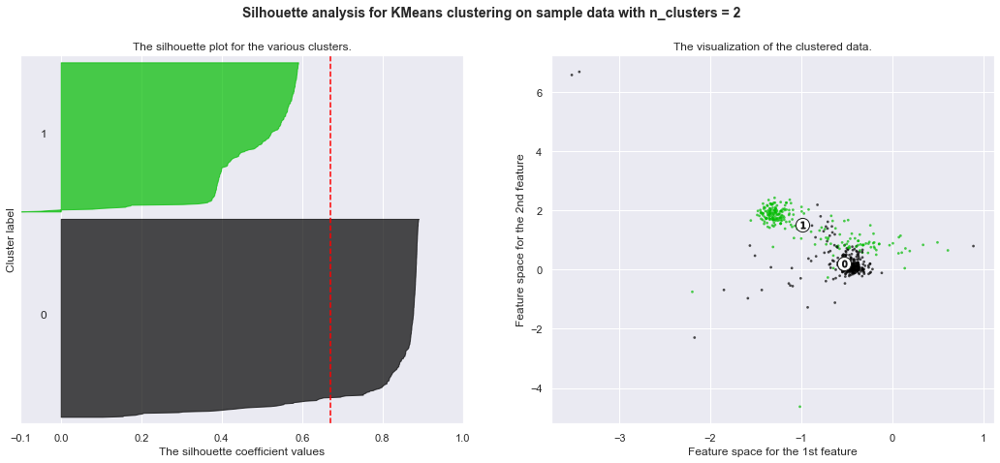

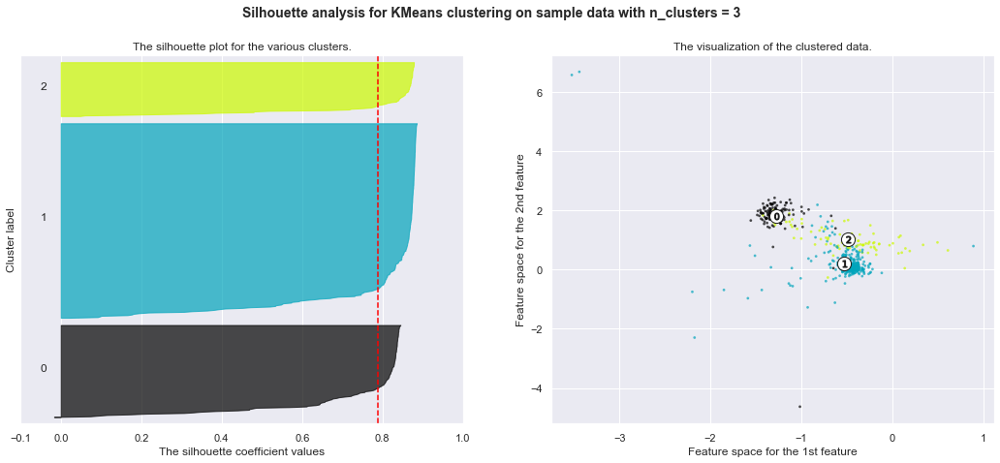

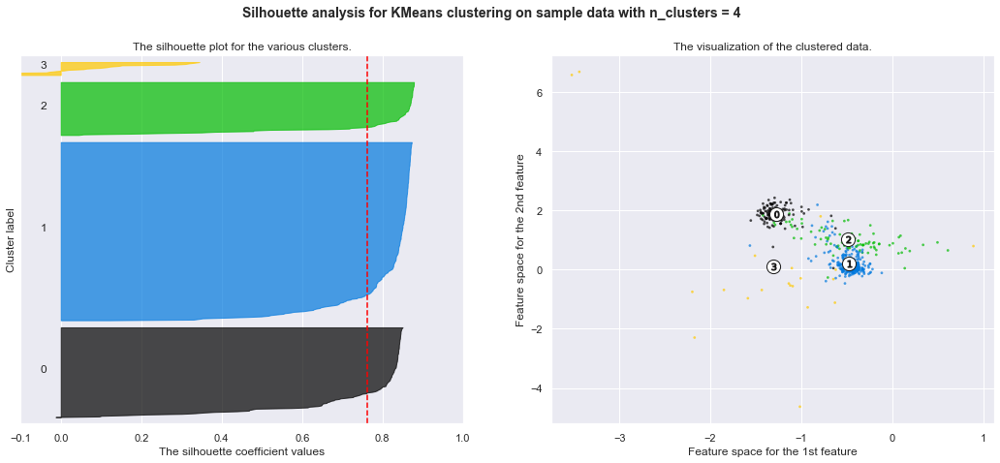

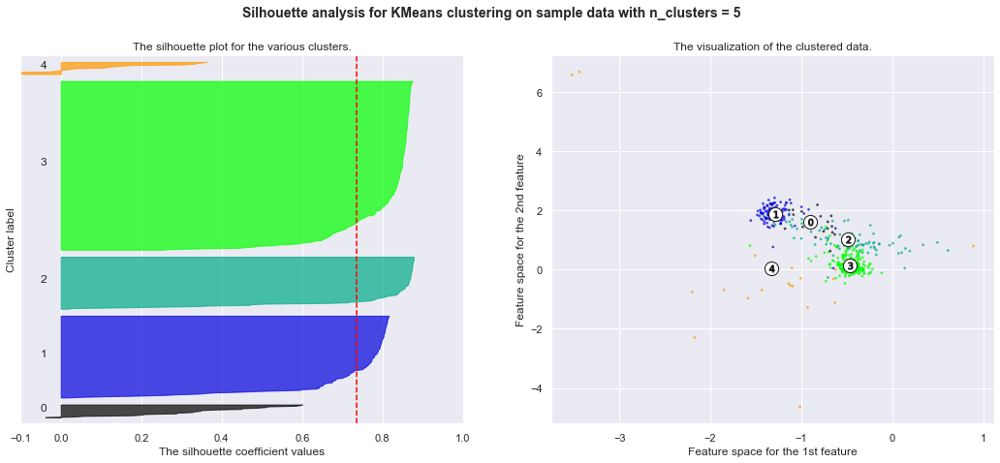

In [21]:
#from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
#X, y = make_blobs(n_samples=500,
#                  n_features=2,
#                  centers=4,
#                  cluster_std=1,
#                  center_box=(-10.0, 10.0),
#                  shuffle=True,
#                  random_state=1)  # For reproducibility
#X, y = g2_joy_e, g0df['Original StoryID'].values[embarrassment+1:joy]
#X = np.concatenate((g0_joy_e, g1_joy_e, g2_joy_e, g3_joy_e), axis=0)
#X = np.concatenate((g0_sad_e, g1_sad_e, g2_sad_e, g3_sad_e), axis=0)
#X = np.concatenate((g0_ris_e, g1_ris_e, g2_ris_e, g3_ris_e), axis=0)
#X = np.concatenate((g0_emb_e, g1_emb_e, g2_emb_e, g3_emb_e), axis=0)
#X = np.concatenate((g0_dis_e, g1_dis_e, g2_dis_e, g3_dis_e), axis=0)

#X = np.concatenate((g0_joy_e, g1_joy_e, g2_joy_e), axis=0)
#X = g3projected[emily+1:jonny]
X = g3projected[:arnold]
#X = g3_joy_e[:,:5]

range_n_clusters = list(range(2,6))

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [22]:
range_n_clusters = list(range(2,51))
def get_silhouette_scores(X):
    s_scores_per_clustering = []
    for n_clusters in range_n_clusters:
        clusterer = KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(X)
        silhouette_avg = silhouette_score(X, cluster_labels)
        s_scores_per_clustering.append(silhouette_avg)
    return s_scores_per_clustering

In [26]:
g0_s_scores = get_silhouette_scores(g0projected[:arnold])
g1_s_scores = get_silhouette_scores(g1projected[:arnold])
g2_s_scores = get_silhouette_scores(g2projected[:arnold])
g3_s_scores = get_silhouette_scores(g3projected[:arnold])

//anaconda3/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:1008: ConvergenceWarning: Number of distinct clusters (6) found smaller than n_clusters (7). Possibly due to duplicate points in X.
  return self.fit(X, sample_weight=sample_weight).labels_
//anaconda3/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:1008: ConvergenceWarning: Number of distinct clusters (6) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  return self.fit(X, sample_weight=sample_weight).labels_
//anaconda3/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:1008: ConvergenceWarning: Number of distinct clusters (6) found smaller than n_clusters (9). Possibly due to duplicate points in X.
  return self.fit(X, sample_weight=sample_weight).labels_
//anaconda3/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:1008: ConvergenceWarning: Number of distinct clusters (6) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  return self.fit(X, sample_w

In [31]:
g1_minus_g0 = np.array(g1_s_scores) - np.array(g0_s_scores)
g2_minus_g1 = np.array(g2_s_scores) - np.array(g1_s_scores)
g3_minus_g2 = np.array(g3_s_scores) - np.array(g2_s_scores)

In [24]:
#all_arnold = np.concatenate((g0projected[:arnold],g1projected[:arnold],g2projected[:arnold],g3projected[:arnold]),axis=0)
#g0_s_scores = get_silhouette_scores(all_arnold)                 

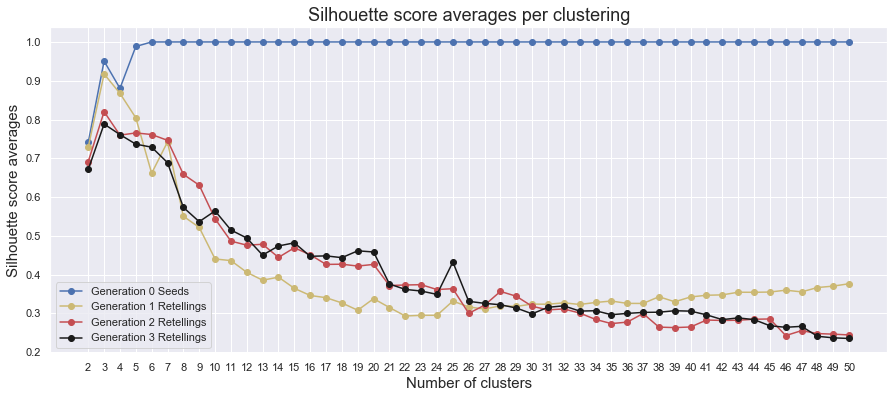

In [38]:
plt.figure(figsize=(15,6))
plt.title('Silhouette score averages per clustering',fontsize=18)
plt.plot(g0_s_scores, 'b-o', label="Generation 0 Seeds")
plt.plot(g1_s_scores, 'y-o', label="Generation 1 Retellings")
plt.plot(g2_s_scores, 'r-o', label="Generation 2 Retellings")
plt.plot(g3_s_scores, 'k-o', label="Generation 3 Retellings")
plt.legend()
plt.xticks(list(range(len(range_n_clusters))),range_n_clusters)
#plt.xticks(np.arange(0, len(range_n_clusters), step=5),range_n_clusters) 
plt.xlabel('Number of clusters',fontsize=15)
plt.ylabel('Silhouette score averages',fontsize=15)
plt.show()

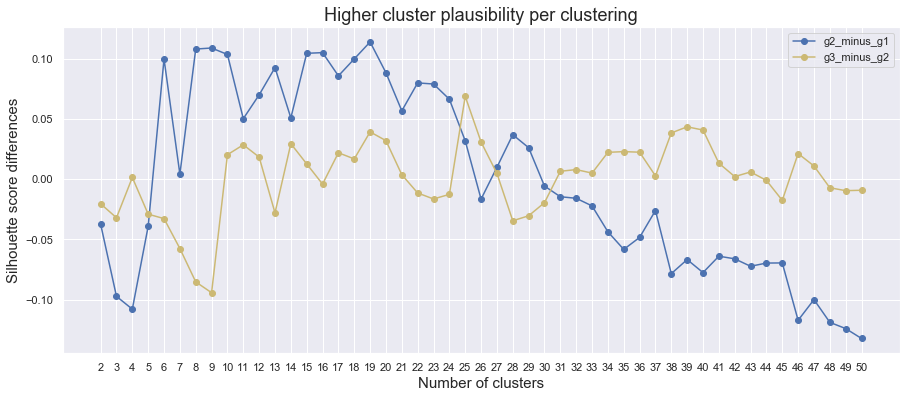

In [37]:
plt.figure(figsize=(15,6))
plt.title('Higher cluster plausibility per clustering',fontsize=18)
plt.plot(g2_minus_g1, 'b-o', label="g2_minus_g1")
plt.plot(g3_minus_g2, 'y-o', label="g3_minus_g2")
plt.legend()
plt.xticks(list(range(len(range_n_clusters))),range_n_clusters)
#plt.xticks(np.arange(0, len(range_n_clusters), step=5),range_n_clusters) 
plt.xlabel('Number of clusters',fontsize=15)
plt.ylabel('Silhouette score differences',fontsize=15)
plt.show()

In [14]:
# Disgust
arnold = 521 # 1st to 522st row
avery = 1020
jay = 1673
# Embarrassment
anna = 2178
robert = 2771
samuel = 3362
# Joy
julia = 3923
rebecca = 4504
tony = 5054
# Risk
claire = 5575
sherry = 6182
taylor = 6816
# Sadness
benny = 7380
emily = 7824
jonny = 8575

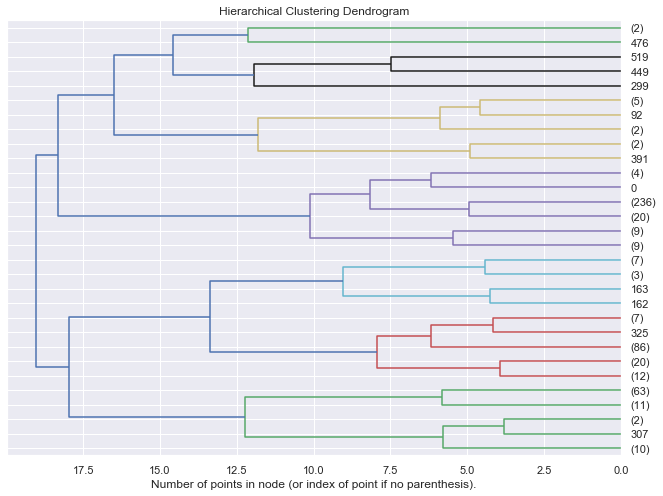

In [33]:
from scipy.cluster.hierarchy import dendrogram, leaves_list
from sklearn.cluster import AgglomerativeClustering


def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix,orientation='left', **kwargs)
    #plt.xticks(rotation='vertical',fontsize=11)
    plt.yticks(fontsize=11)
    return leaves_list(linkage_matrix)


#X = g3_joy_e
X = g3projected[:arnold]

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(affinity='euclidean',linkage='complete',n_clusters=None,distance_threshold=0)

model = model.fit(X)
plt.figure(figsize=(11,8))
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
leafs = plot_dendrogram(model, truncate_mode='lastp')#, p=4)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [20]:
ratings = []
for i in range(87,213):
    index = leafs[i]
    ratings.append(g3df['G3 Affect Rating'].values[:arnold][index])
print(ratings)
# Print stats ignoring nan values
print("\n")
print("Mean of ratings in cluster:",np.nanmean(ratings))
print("Std of ratings in cluster:",np.nanstd(ratings))

[3.45, 3.825, 3.025, 0.125, 4.55, 4.15, 4.175, 4.16, 3.775, 2.8, 4.3, 5.12, 3.025, 3.95, 4.64, 4.0, 5.025, 3.9, 4.075, 3.2, 2.8, 2.1, 0.4, 1.575, 2.95, 6.25, 4.22, nan, 5.325, 3.5, 4.3, 1.9, 3.2, 3.125, 0.775, 3.5, 1.25, 1.675, 4.875, 0.6, 2.15, 3.6, 4.375, 0.466666667, 4.15, 6.06, 4.85, 0.0, 2.44, 3.525, 6.533333333, 2.975, 1.45, 2.233333333, 1.25, 3.625, 4.033333333, 5.025, 3.76, 5.0, 2.6, 4.95, 1.875, 4.45, 5.425, 3.14, 1.275, 1.525, 1.36, 3.1, 3.625, 2.15, 4.1, 3.44, 0.95, 3.64, 4.3, 3.525, 1.125, 3.0, 5.7, 2.85, 2.96, 5.74, 4.625, 4.425, 0.84, 3.25, 4.85, 3.45, 1.7, 3.15, 4.25, 5.725, 3.5, 4.075, 4.9, 4.375, 3.925, 5.575, 4.65, 5.5, 3.725, 4.025, 3.9, 3.175, 1.85, 1.86, 4.9, 5.525, 3.05, 4.075, 3.85, 2.25, 4.9, 4.3, 4.5, 4.4, 1.575, 3.85, 2.825, 0.8, 0.6, 0.575, 2.9, 1.75]


Mean of ratings in cluster: 3.3745733333279997
Std of ratings in cluster: 1.4706933195428595


In [64]:
g2df['G2 Affect Rating'].values[521]

0.2

In [71]:
g2df['G2 Retelling'].values[25]#[emily+1:jonny][58]

'Arnold and his girlfriend are out taking pictures. Their car breaks down and they have to walk by foot to get help.'

In [118]:
#g0df['Original text'].values[1487]
g2df['G2 Retelling'].values[745]
g2df['G2 Retelling'].values[944]
g3df['G3 Retelling'].values[299]

'The dog says woof woof woof woof. The cat says meow meow meow meow. The duck says quack quack quack quack. Woof. Meow. Quack. The cow says moo'